
# Analysis of Synthetic CIFAR-10 Cats vs. Original CIFAR-10 Cats

This notebook compares your synthetic CIFAR‑10 cat images (located in
`/home/ubuntu/KarolMgr/sd-imbalance/notebooks/blurry_LoRA_full_prompt`) with the original CIFAR‑10 “cat” images from torchvision.

We will:
- Load and inspect both datasets.
- Compute per-channel statistics (mean, standard deviation) and overall brightness.
- Plot histograms of pixel values and channel means.
- Use PCA to visualize the distribution of images in a lower-dimensional space.
- Display a few sample images.

All plots are created with Plotly for interactive exploration.


In [1]:
# %%
import os
import glob
import numpy as np
import pandas as pd
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt

# For PCA
from sklearn.decomposition import PCA

# PyTorch & torchvision for the original dataset
import torch
from torchvision.datasets import CIFAR10
import torchvision.transforms as transforms


# Set Plotly renderer (you can change this if needed)
import plotly.io as pio

pio.renderers.default = "notebook"

# For reproducibility
np.random.seed(42)

## Load Original CIFAR-10 Cat Images

We download (if necessary) the CIFAR-10 training set using torchvision. Since CIFAR-10
has 10 classes, we filter only the “cat” images. (In CIFAR-10, the `"cat"` label is mapped to `3`.)


In [2]:
# Define a transform to convert images to tensors in [0, 1]
transform = transforms.Compose(
    [
        transforms.ToTensor(),  # Converts PIL image to Tensor (C x H x W) in [0,1]
    ]
)

# Download and load the training set
cifar10_dataset = CIFAR10(root="./data", train=True, download=True, transform=transform)

# Get the label for 'cat'
cat_label = cifar10_dataset.class_to_idx["cat"]  # should be 3

# Filter out only cat images
original_cat_images = [img for img, label in cifar10_dataset if label == cat_label]

print(f"Number of original CIFAR-10 cat images: {len(original_cat_images)}")

Number of original CIFAR-10 cat images: 5000


In [3]:
# Path to your synthetic images (update if necessary)
synthetic_path = "/home/karol/sd-imbalance/flux_tests"

# List all image files (png, jpg, jpeg)
synthetic_image_files = (
    glob.glob(os.path.join(synthetic_path, "*.png"))
    + glob.glob(os.path.join(synthetic_path, "*.jpg"))
    + glob.glob(os.path.join(synthetic_path, "*.jpeg"))
)

# Load images using PIL
synthetic_cat_images = []
for img_file in synthetic_image_files:
    try:
        img = Image.open(img_file).convert("RGB")
        synthetic_cat_images.append(img)
    except Exception as e:
        print(f"Error loading {img_file}: {e}")

print(f"Number of synthetic cat images: {len(synthetic_cat_images)}")

Number of synthetic cat images: 9589


In [4]:
def convert_tensor_to_array(img_tensor):
    """
    Convert a PyTorch tensor (C x H x W) to a NumPy array (H x W x C).
    Assumes the tensor is in [0, 1].
    """
    return img_tensor.permute(1, 2, 0).numpy()


def ensure_array(img, source="pil"):
    """
    Given an image either as a PIL image or as a PyTorch tensor,
    return a NumPy array of shape (H, W, C) with values in [0, 1] (if applicable).
    """
    if source == "pil":
        # Convert PIL image to numpy array and scale to [0, 1]
        arr = np.array(img).astype(np.float32) / 255.0
        # If the image is grayscale, replicate channels
        if arr.ndim == 2:
            arr = np.stack([arr] * 3, axis=-1)
    elif source == "tensor":
        arr = convert_tensor_to_array(img)
    elif source == "numpy":
        arr = img
    else:
        raise ValueError("Unknown source type.")
    return arr


def compute_image_statistics(img_array):
    """
    Compute per-channel mean and standard deviation for a single image array.
    """
    mean = img_array.mean(axis=(0, 1))
    std = img_array.std(axis=(0, 1))
    brightness = img_array.mean()  # average brightness over all channels
    return mean, std, brightness


def aggregate_dataset_stats(image_list, source="pil"):
    """
    Compute aggregated statistics for a list of images.
    Returns:
      - avg_channel_mean: Mean of means over images (per channel)
      - avg_channel_std: Mean of std dev over images (per channel)
      - brightnesses: List of overall brightness per image
    """
    channel_means = []
    channel_stds = []
    brightnesses = []

    for img in image_list:
        arr = ensure_array(img, source=source)
        mean, std, brightness = compute_image_statistics(arr)
        channel_means.append(mean)
        channel_stds.append(std)
        brightnesses.append(brightness)

    channel_means = np.array(channel_means)
    channel_stds = np.array(channel_stds)
    avg_channel_mean = channel_means.mean(axis=0)
    avg_channel_std = channel_stds.mean(axis=0)

    return avg_channel_mean, avg_channel_std, brightnesses


def images_to_flat_array(image_list, source="pil"):
    """
    Convert a list of images into a 2D array where each row is a flattened image.
    """
    arr_list = []
    for img in image_list:
        arr = ensure_array(img, source=source)
        arr_list.append(arr.flatten())
    return np.array(arr_list)

## Compute and Compare Statistics

We calculate:
- Channel-wise average mean and standard deviation.
- Distribution of overall brightness.
- And then visualize these with Plotly.

In [5]:
# Original CIFAR-10 cat images (source: tensor)
orig_avg_mean, orig_avg_std, orig_brightness = aggregate_dataset_stats(
    original_cat_images, source="tensor"
)
print("Original CIFAR-10 cat images:")
print(f"  Average per-channel mean: {orig_avg_mean}")
print(f"  Average per-channel std:  {orig_avg_std}")
print(f"  Overall brightness (first 5 values): {np.array(orig_brightness)[:5]}")

# Synthetic images (source: pil)
synth_avg_mean, synth_avg_std, synth_brightness = aggregate_dataset_stats(
    synthetic_cat_images, source="pil"
)
print("\nSynthetic cat images:")
print(f"  Average per-channel mean: {synth_avg_mean}")
print(f"  Average per-channel std:  {synth_avg_std}")
print(f"  Overall brightness (first 5 values): {np.array(synth_brightness)[:5]}")

Original CIFAR-10 cat images:
  Average per-channel mean: [0.4954817  0.45641166 0.41553804]
  Average per-channel std:  [0.21029162 0.2073054  0.20723984]
  Overall brightness (first 5 values): [0.2764655  0.34873366 0.40780744 0.32810077 0.47184053]

Synthetic cat images:
  Average per-channel mean: [0.49306995 0.42785892 0.35056067]
  Average per-channel std:  [0.20962892 0.20341204 0.20028785]
  Overall brightness (first 5 values): [0.40430692 0.33868542 0.08245483 0.49502873 0.37190333]


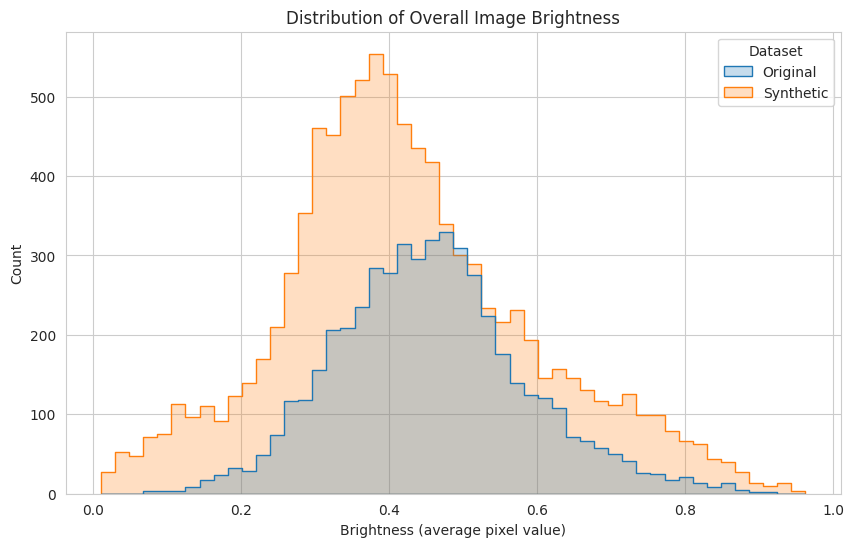

In [6]:
df_brightness = pd.DataFrame(
    {
        "Brightness": np.concatenate([orig_brightness, synth_brightness]),
        "Dataset": ["Original"] * len(orig_brightness)
        + ["Synthetic"] * len(synth_brightness),
    }
)

# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Create the histogram
plt.figure(figsize=(10, 6))
sns.histplot(
    data=df_brightness,
    x="Brightness",
    hue="Dataset",
    element="step",
    stat="count",
    bins=50,
    common_norm=False,
)

# Add titles and labels
plt.title("Distribution of Overall Image Brightness")
plt.xlabel("Brightness (average pixel value)")
plt.ylabel("Count")

# Show the plot
plt.show()

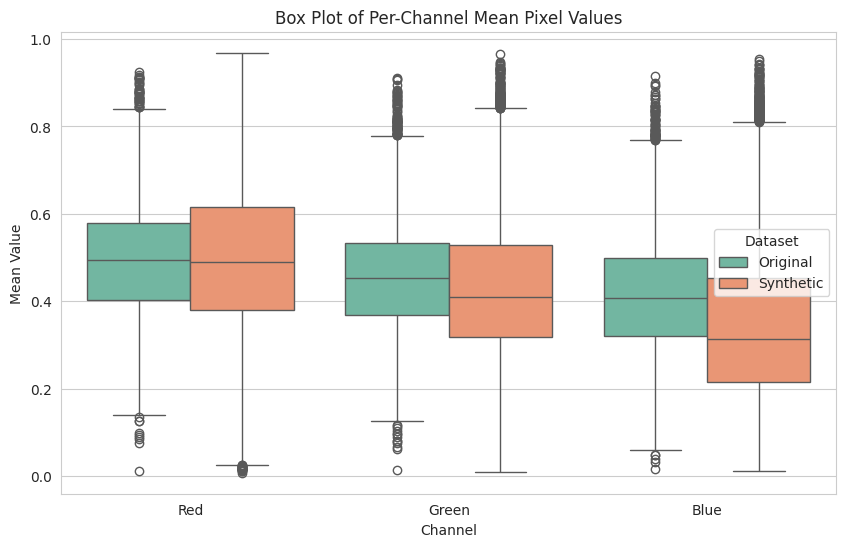

In [154]:
def create_channel_df(image_list, source="pil"):
    channels = ["Red", "Green", "Blue"]
    data = {ch: [] for ch in channels}
    for img in image_list:
        arr = ensure_array(img, source=source)
        # Compute channel means
        means = arr.mean(axis=(0, 1))
        for i, ch in enumerate(channels):
            data[ch].append(means[i])
    return pd.DataFrame(data)


df_orig = create_channel_df(original_cat_images, source="tensor")
df_orig["Dataset"] = "Original"

df_synth = create_channel_df(synthetic_cat_images, source="pil")
df_synth["Dataset"] = "Synthetic"

df_channels = pd.concat([df_orig, df_synth], ignore_index=True)
df_channels = pd.melt(
    df_channels,
    id_vars="Dataset",
    value_vars=["Red", "Green", "Blue"],
    var_name="Channel",
    value_name="Mean Value",
)

sns.set_style("whitegrid")

# Create the box plot
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=df_channels, x="Channel", y="Mean Value", hue="Dataset", palette="Set2"
)

# Add titles and labels
plt.title("Box Plot of Per-Channel Mean Pixel Values")
plt.xlabel("Channel")
plt.ylabel("Mean Value")

# Display the plot
plt.show()

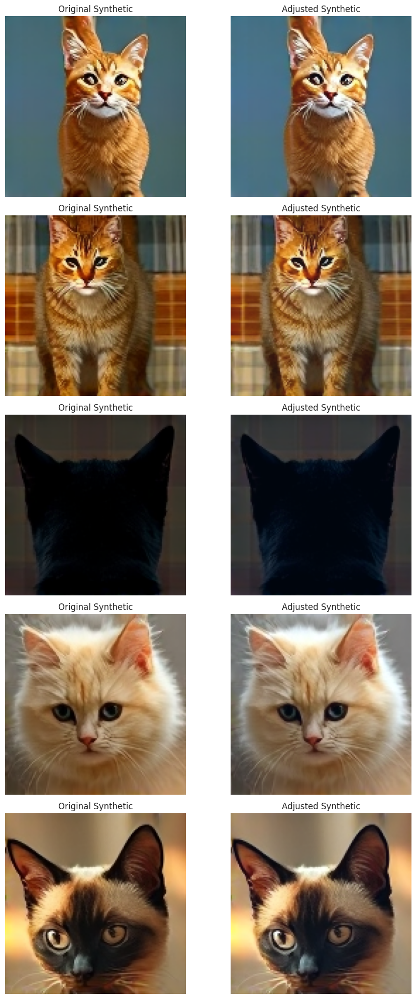

Original CIFAR-10 cat images:
  Average per-channel mean: [0.4954817  0.45641166 0.41553804]
  Average per-channel std:  [0.21029162 0.2073054  0.20723984]
  Overall brightness (first 5 values): [0.2764655  0.34873366 0.40780744 0.32810077 0.47184053]

Synthetic cat images:
  Average per-channel mean: [0.49360262 0.45380346 0.41152444]
  Average per-channel std:  [0.21040445 0.20654796 0.20520138]
  Overall brightness (first 5 values): [0.43529476 0.36694655 0.10742602 0.5270661  0.40131453]


In [ ]:
import numpy as np
from PIL import Image


def adjust_images(synthetic_images, orig_mean, orig_std, synth_mean, synth_std):
    """Apply histogram matching to synthetic images using mean-std adjustment."""
    synthetic_images = np.array(
        synthetic_images, dtype=np.float32
    )  # Ensure float format

    if synthetic_images.max() > 1.1:
        synthetic_images /= 255.0  # Normalize if needed

    adjusted_images = (synthetic_images - synth_mean[None, None, None, :]) / synth_std[
        None, None, None, :
    ]
    adjusted_images = (
        adjusted_images * orig_std[None, None, None, :] + orig_mean[None, None, None, :]
    )

    adjusted_images = np.clip(adjusted_images * 255, 0, 255).astype(np.uint8)

    return adjusted_images


adjusted_synthetic_images = adjust_images(
    synthetic_cat_images, orig_avg_mean, orig_avg_std, synth_avg_mean, synth_avg_std
)


def np_to_pil(x):
    return Image.fromarray(x)


fig, axes = plt.subplots(5, 2, figsize=(10, 20))
for i in range(5):
    axes[i, 0].imshow(synthetic_cat_images[i])
    axes[i, 0].axis("off")
    axes[i, 0].set_title("Original Synthetic")
    axes[i, 1].imshow(np_to_pil(adjusted_synthetic_images[i]))
    axes[i, 1].axis("off")
    axes[i, 1].set_title("Adjusted Synthetic")
plt.tight_layout()
plt.show()

orig_avg_mean, orig_avg_std, orig_brightness = aggregate_dataset_stats(
    original_cat_images, source="tensor"
)
print("Original CIFAR-10 cat images:")
print(f"  Average per-channel mean: {orig_avg_mean}")
print(f"  Average per-channel std:  {orig_avg_std}")
print(f"  Overall brightness (first 5 values): {np.array(orig_brightness)[:5]}")

# Synthetic images (source: pil)
synth_avg_mean, synth_avg_std, synth_brightness = aggregate_dataset_stats(
    adjusted_synthetic_images, source="numpy"
)
print("\nSynthetic cat images:")
print(f"  Average per-channel mean: {synth_avg_mean / 255}")
print(f"  Average per-channel std:  {synth_avg_std / 255}")
print(f"  Overall brightness (first 5 values): {np.array(synth_brightness)[:5] / 255}")

### PCA on Image Data

We flatten each image into a vector and run PCA (reducing to 2 dimensions) to see if
the two datasets have a similar distribution in the high-dimensional pixel space.

Number of original samples: 5000
Number of synthetic samples: 5000
Number of adjusted synthetic samples: 5000
Shape of first original sample: torch.Size([3, 32, 32])
Shape of first synthetic sample: (128, 128)
Shape of first adjusted synthetic sample: (128, 128, 3)
Original flattened shape: (5000, 3072)
Synthetic flattened shape: (5000, 3072)
Adjusted synthetic flattened shape: (5000, 3072)
Explained variance ratio by PCA components: [0.68795264 0.06692088]


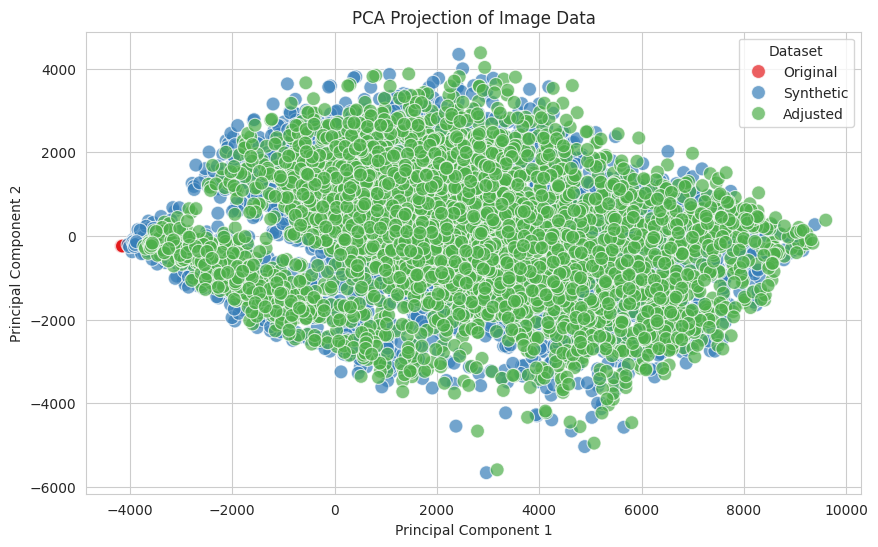

In [156]:
# Limit to a subset of images (for speed) if needed
n_samples = 5000  # adjust based on available memory and speed
orig_samples = original_cat_images[: min(n_samples, len(original_cat_images))]
print(f"Number of original samples: {len(orig_samples)}")
synth_samples = synthetic_cat_images[: min(n_samples, len(synthetic_cat_images))]
print(f"Number of synthetic samples: {len(synth_samples)}")
adj_samples = adjusted_synthetic_images[
    : min(n_samples, len(adjusted_synthetic_images))
]
print(f"Number of adjusted synthetic samples: {len(adj_samples)}")

# Print shape information for debugging
print(
    f"Shape of first original sample: {orig_samples[0].shape if hasattr(orig_samples[0], 'shape') else 'Not a tensor'}"
)
print(
    f"Shape of first synthetic sample: {synth_samples[0].size if hasattr(synth_samples[0], 'size') else 'Not a PIL image'}"
)
print(
    f"Shape of first adjusted synthetic sample: {adj_samples[0].shape if hasattr(adj_samples[0], 'shape') else 'Not a tensor'}"
)


# Flatten images - ensure consistent dimensions
# CIFAR-10 images are 32x32x3 (3072 flattened)
# Make sure synthetic images are also resized to 32x32 before flattening
def resize_and_flatten(images, source="pil", target_size=(32, 32)):
    if source == "pil":
        # Resize PIL images and convert to numpy arrays
        resized = [img.resize(target_size) for img in images]
        return np.array([np.array(img).flatten() for img in resized])
    elif source == "tensor":
        # For tensors, ensure they're the right size then flatten
        return np.array([img.numpy().flatten() for img in images])
    elif source == "numpy":
        # For numpy arrays, resize if needed then flatten
        resized = [
            img
            if img.shape[:2] == target_size
            else np.array(Image.fromarray(img).resize(target_size))
            for img in images
        ]
        return np.array([img.flatten() for img in resized])
    else:
        raise ValueError(f"Unknown source: {source}")


# Use the new function
orig_flat = resize_and_flatten(orig_samples, source="tensor", target_size=(32, 32))
synth_flat = resize_and_flatten(synth_samples, source="pil", target_size=(32, 32))
adj_flat = resize_and_flatten(adj_samples, source="numpy", target_size=(32, 32))

# Verify shapes
print(f"Original flattened shape: {orig_flat.shape}")
print(f"Synthetic flattened shape: {synth_flat.shape}")
print(f"Adjusted synthetic flattened shape: {adj_flat.shape}")

# Now ensure both have the same number of features before concatenating
min_features = min(orig_flat.shape[1], synth_flat.shape[1])
orig_flat = orig_flat[:, :min_features]
synth_flat = synth_flat[:, :min_features]
adj_flat = adj_flat[:, :min_features]

# Combine the data and create labels
X = np.concatenate([orig_flat, synth_flat, adj_flat], axis=0)
labels = (
    ["Original"] * orig_flat.shape[0]
    + ["Synthetic"] * synth_flat.shape[0]
    + ["Adjusted"] * adj_flat.shape[0]
)

# Run PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)
print("Explained variance ratio by PCA components:", pca.explained_variance_ratio_)

# Create a DataFrame for visualization
df_pca = pd.DataFrame({"PC1": X_pca[:, 0], "PC2": X_pca[:, 1], "Dataset": labels})

plt.figure(figsize=(10, 6))
scatter_plot = sns.scatterplot(
    data=df_pca,
    x="PC1",
    y="PC2",
    hue="Dataset",
    palette="Set1",
    s=100,  # Adjust the size of the points
    alpha=0.7,  # Adjust the transparency of the points
)

# Add titles and labels
plt.title("PCA Projection of Image Data")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")

# Add a legend
plt.legend(title="Dataset")

# Show the plot
plt.show()

## Comparison of upscalers

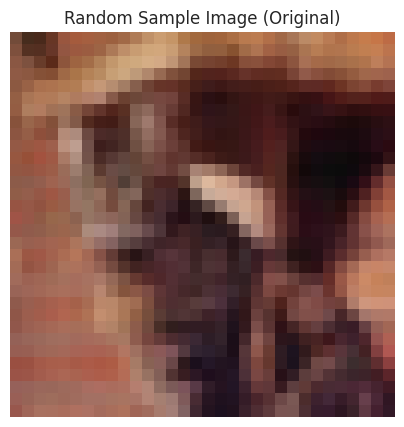

In [137]:
import random
import matplotlib.pyplot as plt
import numpy as np


def get_random_image(image_list, source="pil"):
    """Randomly select one image from the image_list and convert it to an array."""
    img = random.choice(image_list)
    return ensure_array(img, source=source)


# Select one random image from each dataset
sample_orig = get_random_image(original_cat_images, source="tensor")

# Display the image
plt.figure(figsize=(5, 5))
plt.imshow(
    (sample_orig * 255).astype(np.uint8)
)  # Change to `sample_synth` for a synthetic image
plt.title(
    "Random Sample Image (Original)"
)  # Change to "Synthetic" if using sample_synth
plt.axis("off")  # Hide axis ticks
plt.show()

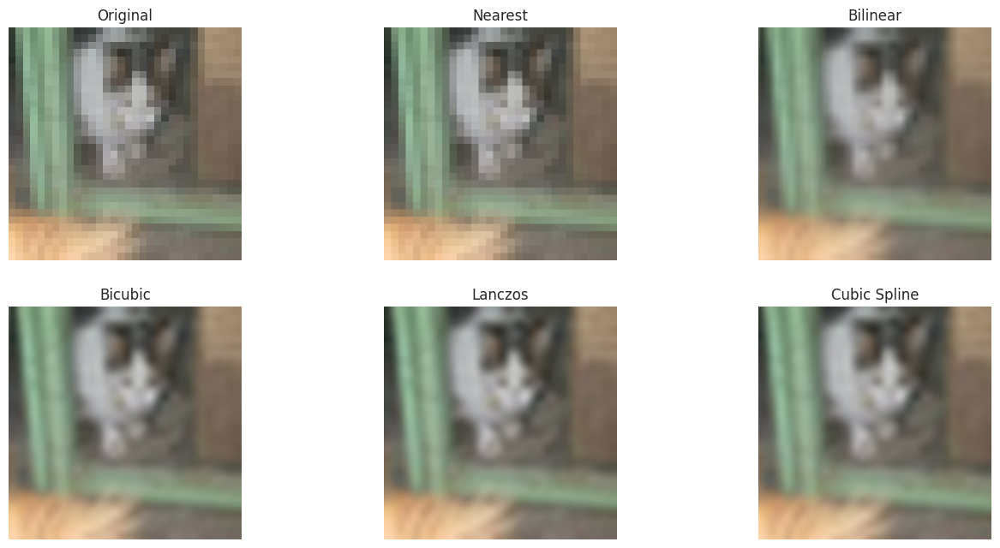

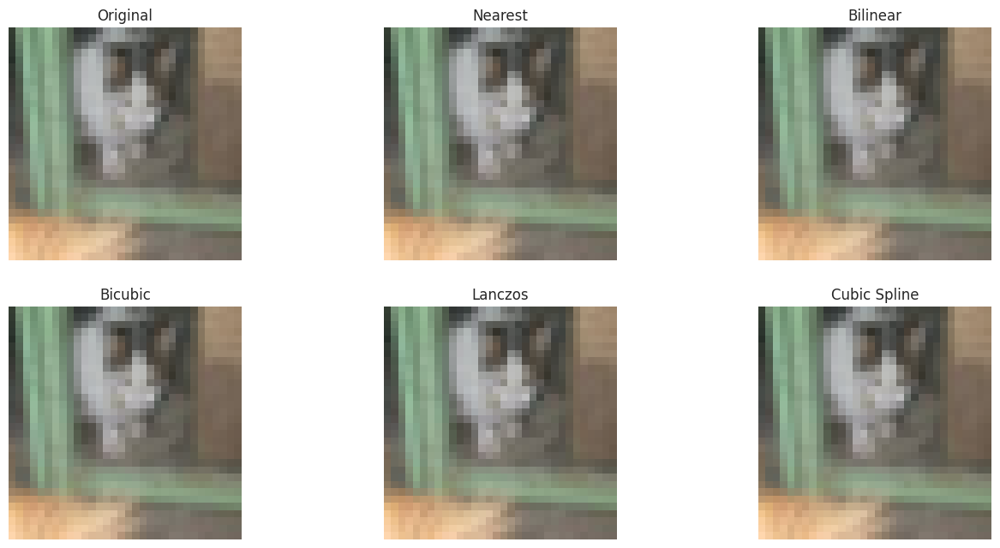

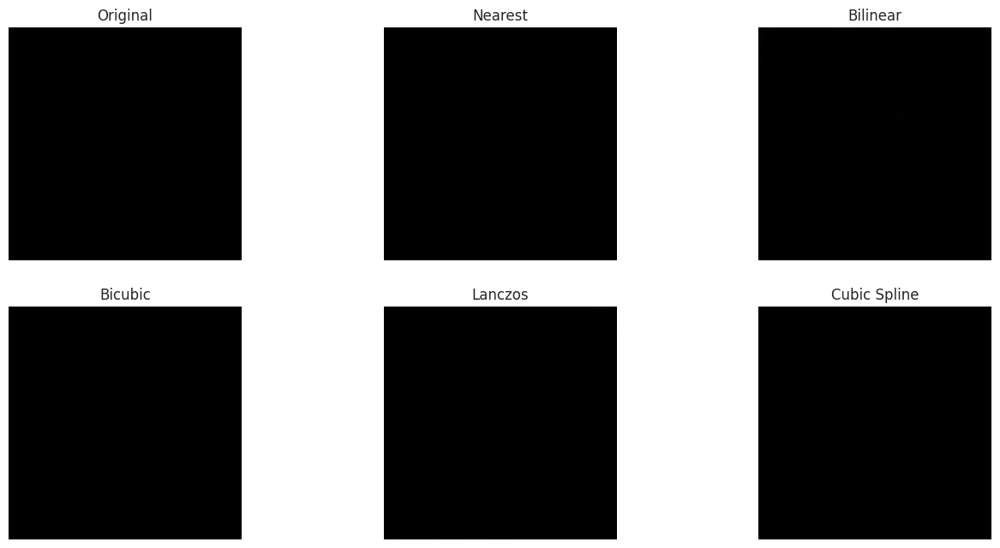

Differences:
Original: Max difference = 0.0000, Mean difference = 0.0000
Nearest: Max difference = 0.0000, Mean difference = 0.0000
Bilinear: Max difference = 0.0105, Mean difference = 0.0015
Bicubic: Max difference = 0.0001, Mean difference = 0.0000
Lanczos: Max difference = 0.0039, Mean difference = 0.0004
Cubic Spline: Max difference = 0.0000, Mean difference = 0.0000


In [120]:
import numpy as np
import cv2
from skimage.transform import resize
from scipy.ndimage import zoom
from PIL import Image

# Ensure sample_orig is in the right format (assuming it's a numpy array with values between 0 and 1)
sample_uint8 = (sample_orig * 255).astype(np.uint8)

# Target size for upscaling
target_size = (512, 512)
downsample_size = (32, 32)

# Method 1: Nearest Neighbor
nearest = resize(sample_orig, target_size, order=0, anti_aliasing=False)
down_nearest = resize(nearest, downsample_size, order=0, anti_aliasing=False)

# Method 2: Bilinear
bilinear = resize(sample_orig, target_size, order=1, anti_aliasing=False)
down_bilinear = resize(bilinear, downsample_size, order=1, anti_aliasing=False)

# Method 3: Bicubic
bicubic = resize(sample_orig, target_size, order=3, anti_aliasing=False)
down_bicubic = resize(bicubic, downsample_size, order=3, anti_aliasing=False)

# Method 4: Lanczos (OpenCV)
if len(sample_uint8.shape) == 3:
    lanczos = cv2.resize(sample_uint8, target_size, interpolation=cv2.INTER_LANCZOS4)
    lanczos = lanczos.astype(float) / 255.0

    # Downsample using the same Lanczos algorithm
    down_lanczos = (
        cv2.resize(
            (lanczos * 255).astype(np.uint8),
            downsample_size,
            interpolation=cv2.INTER_LANCZOS4,
        ).astype(float)
        / 255.0
    )
else:
    lanczos = cv2.resize(sample_uint8, target_size, interpolation=cv2.INTER_LANCZOS4)
    lanczos = lanczos.astype(float) / 255.0

    # Downsample using the same Lanczos algorithm
    down_lanczos = (
        cv2.resize(
            (lanczos * 255).astype(np.uint8),
            downsample_size,
            interpolation=cv2.INTER_LANCZOS4,
        ).astype(float)
        / 255.0
    )

# Method 5: Cubic spline (SciPy)
zoom_factors = [
    target_size[0] / sample_orig.shape[0],
    target_size[1] / sample_orig.shape[1],
]
if len(sample_orig.shape) == 3:
    zoom_factors.append(1)
spline = zoom(sample_orig, zoom_factors, order=3)

# Downsample using the same cubic spline algorithm
down_zoom_factors = [
    downsample_size[0] / spline.shape[0],
    downsample_size[1] / spline.shape[1],
]
if len(spline.shape) == 3:
    down_zoom_factors.append(1)
down_spline = zoom(spline, down_zoom_factors, order=3)

# Also downsample original with nearest neighbor for comparison
down_orig = resize(sample_orig, downsample_size, order=0, anti_aliasing=False)

# List of all images
images = [sample_orig, nearest, bilinear, bicubic, lanczos, spline]
titles = ["Original", "Nearest", "Bilinear", "Bicubic", "Lanczos", "Cubic Spline"]
downsampled = [
    down_orig,
    down_nearest,
    down_bilinear,
    down_bicubic,
    down_lanczos,
    down_spline,
]

downsampled_minus_orig = [np.abs(down - down_orig) for down in downsampled]

# Display the images
plt.figure(figsize=(16, 12))
for i, (img, title) in enumerate(zip(images, titles)):
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.title(title)
    plt.axis("off")

plt.show()

# Display the downsampled images
plt.figure(figsize=(16, 12))
for i, (img, title) in enumerate(zip(downsampled, titles)):
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.title(title)
    plt.axis("off")

plt.show()

# Display the difference between downsampled and original images
plt.figure(figsize=(16, 12))
for i, (img, title) in enumerate(zip(downsampled_minus_orig, titles)):
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.title(title)
    plt.axis("off")

plt.show()

print("Differences:")
for title, diff in zip(titles, downsampled_minus_orig):
    print(
        f"{title}: Max difference = {diff.max():.4f}, Mean difference = {diff.mean():.4f}"
    )

         Method       MSE       PSNR      SSIM       MAE  Correlation  \
0       Nearest  0.000341  34.676671  0.987473  0.012021     0.997837   
1      Bilinear  0.000594  32.258789  0.978241  0.016155     0.996233   
2       Bicubic  0.000270  35.692514  0.990355  0.010876     0.998282   
3       Lanczos  0.000240  36.201661  0.991332  0.010049     0.998460   
4  Cubic Spline  0.000804  30.947209  0.975669  0.018910     0.994963   

   Mean Diff  Std Diff  
0   0.000415  0.005658  
1   0.001799  0.007633  
2   0.001871  0.004530  
3   0.000036  0.004420  
4   0.002756  0.009197  


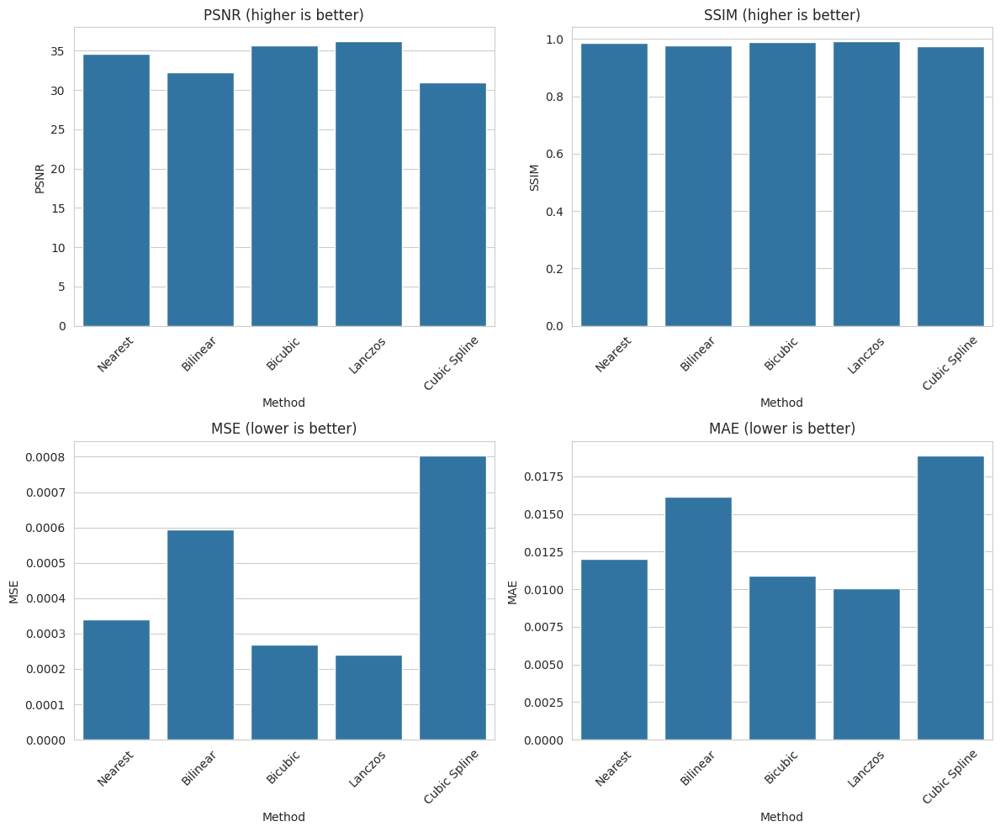

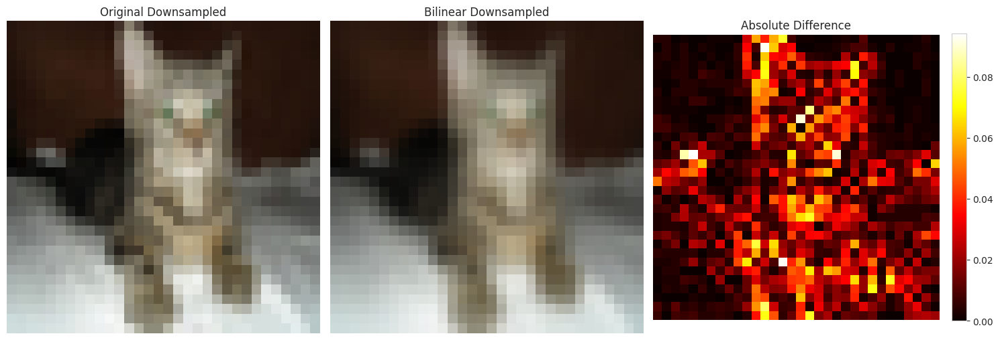

In [46]:
import numpy as np
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error as mse
from scipy.stats import pearsonr
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define reference image (original downsampled)
reference = downsampled[0]

# Initialize dict to store metrics
metrics = {
    "Method": titles[1:],  # Skip 'Original'
    "MSE": [],
    "PSNR": [],
    "SSIM": [],
    "MAE": [],
    "Correlation": [],
    "Mean Diff": [],
    "Std Diff": [],
}

# Calculate metrics for each method compared to reference
for i in range(1, len(downsampled)):
    img = downsampled[i]

    # Mean Squared Error
    metrics["MSE"].append(mse(reference, img))

    # Peak Signal to Noise Ratio
    metrics["PSNR"].append(psnr(reference, img, data_range=1.0))

    # Structural Similarity Index
    if len(reference.shape) == 3:  # RGB image
        ss = ssim(reference, img, data_range=1.0, channel_axis=2)
    else:  # Grayscale
        ss = ssim(reference, img, data_range=1.0)
    metrics["SSIM"].append(ss)

    # Mean Absolute Error
    metrics["MAE"].append(np.mean(np.abs(reference - img)))

    # Pearson correlation
    if len(reference.shape) == 3:  # RGB image
        # Calculate correlation for each channel and take mean
        corrs = []
        for c in range(reference.shape[2]):
            corr, _ = pearsonr(reference[:, :, c].flatten(), img[:, :, c].flatten())
            corrs.append(corr)
        metrics["Correlation"].append(np.mean(corrs))
    else:
        corr, _ = pearsonr(reference.flatten(), img.flatten())
        metrics["Correlation"].append(corr)

    # Mean pixel difference
    metrics["Mean Diff"].append(np.abs(np.mean(reference) - np.mean(img)))

    # Standard deviation difference
    metrics["Std Diff"].append(np.abs(np.std(reference) - np.std(img)))

# Create DataFrame
df = pd.DataFrame(metrics)

# Display metrics table
print(df)

# Plot metrics comparison
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Plot PSNR (higher is better)
sns.barplot(x="Method", y="PSNR", data=df, ax=axes[0, 0])
axes[0, 0].set_title("PSNR (higher is better)")
axes[0, 0].tick_params(axis="x", rotation=45)

# Plot SSIM (higher is better)
sns.barplot(x="Method", y="SSIM", data=df, ax=axes[0, 1])
axes[0, 1].set_title("SSIM (higher is better)")
axes[0, 1].tick_params(axis="x", rotation=45)

# Plot MSE (lower is better)
sns.barplot(x="Method", y="MSE", data=df, ax=axes[1, 0])
axes[1, 0].set_title("MSE (lower is better)")
axes[1, 0].tick_params(axis="x", rotation=45)

# Plot MAE (lower is better)
sns.barplot(x="Method", y="MAE", data=df, ax=axes[1, 1])
axes[1, 1].set_title("MAE (lower is better)")
axes[1, 1].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()


# Heatmap of pixel differences
def plot_diff_heatmaps(method_idx=1):
    method_name = titles[method_idx]
    img = downsampled[method_idx]

    plt.figure(figsize=(15, 5))

    plt.subplot(131)
    plt.imshow(reference)
    plt.title("Original Downsampled")
    plt.axis("off")

    plt.subplot(132)
    plt.imshow(img)
    plt.title(f"{method_name} Downsampled")
    plt.axis("off")

    plt.subplot(133)
    diff = np.abs(reference - img)
    if len(diff.shape) == 3:
        # Convert RGB difference to grayscale for visualization
        diff = np.mean(diff, axis=2)
    plt.imshow(diff, cmap="hot")
    plt.title("Absolute Difference")
    plt.colorbar(fraction=0.046, pad=0.04)
    plt.axis("off")

    plt.tight_layout()
    plt.show()


# Show difference heatmap for Bilinear method (index 2)
plot_diff_heatmaps(2)

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import resize
import cv2
from scipy.ndimage import zoom
from PIL import Image
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error as mse
from scipy.stats import pearsonr
import pandas as pd
import seaborn as sns
from tqdm.notebook import tqdm  # Progress bar for notebooks

# Limit to a reasonable number to avoid memory issues
max_cat_images = 50000  # Adjust based on your memory constraints
cat_images = original_cat_images[:max_cat_images]


# Function to process a single image with all upscaling methods
def process_image(image):
    # Convert tensor to numpy if needed
    if hasattr(image, "numpy"):
        image = image.numpy().transpose(1, 2, 0)  # CHW to HWC

    # Ensure values are normalized to 0-1
    if image.max() > 1.0:
        image = image / 255.0

    # Convert to uint8 for OpenCV operations
    image_uint8 = (image * 255).astype(np.uint8)

    # Target size for upscaling
    target_size = (512, 512)

    # Apply different upscaling methods
    nearest = resize(image, target_size, order=0, anti_aliasing=False)
    bilinear = resize(image, target_size, order=1, anti_aliasing=False)
    bicubic = resize(image, target_size, order=3, anti_aliasing=False)

    # Lanczos (OpenCV)
    if len(image_uint8.shape) == 3:
        lanczos = cv2.resize(image_uint8, target_size, interpolation=cv2.INTER_LANCZOS4)
        lanczos = lanczos.astype(float) / 255.0
    else:
        lanczos = cv2.resize(image_uint8, target_size, interpolation=cv2.INTER_LANCZOS4)
        lanczos = lanczos.astype(float) / 255.0

    # Cubic spline (SciPy)
    zoom_factors = [target_size[0] / image.shape[0], target_size[1] / image.shape[1]]
    if len(image.shape) == 3:
        zoom_factors.append(1)
    spline = zoom(image, zoom_factors, order=3)

    # List of all upscaled images
    images = [image, nearest, bilinear, bicubic, lanczos, spline]

    # Downsample each image to 32x32 using PIL
    downsampled = []
    for img in images:
        pil_img = Image.fromarray((img * 255).astype(np.uint8))
        pil_img_resized = pil_img.resize((32, 32), Image.BILINEAR)
        down_img = np.array(pil_img_resized).astype(float) / 255.0
        downsampled.append(down_img)

    return downsampled


# Calculate metrics for one set of downsampled images
def calculate_metrics(downsampled_set):
    reference = downsampled_set[0]  # Original downsampled
    image_metrics = {"MSE": [], "PSNR": [], "SSIM": [], "MAE": [], "Correlation": []}

    for i in range(1, len(downsampled_set)):
        img = downsampled_set[i]

        # Calculate metrics
        image_metrics["MSE"].append(mse(reference, img))
        image_metrics["PSNR"].append(psnr(reference, img, data_range=1.0))

        if len(reference.shape) == 3:  # RGB image
            image_metrics["SSIM"].append(
                ssim(reference, img, data_range=1.0, channel_axis=2)
            )
        else:  # Grayscale
            image_metrics["SSIM"].append(ssim(reference, img, data_range=1.0))

        image_metrics["MAE"].append(np.mean(np.abs(reference - img)))

        # Correlation
        if len(reference.shape) == 3:
            corrs = []
            for c in range(reference.shape[2]):
                corr, _ = pearsonr(reference[:, :, c].flatten(), img[:, :, c].flatten())
                corrs.append(corr)
            image_metrics["Correlation"].append(np.mean(corrs))
        else:
            corr, _ = pearsonr(reference.flatten(), img.flatten())
            image_metrics["Correlation"].append(corr)

    return image_metrics


# Process all selected cat images
all_metrics = {"MSE": [], "PSNR": [], "SSIM": [], "MAE": [], "Correlation": []}

# Process each image and collect metrics
print(f"Processing {len(cat_images)} cat images...")
for img in tqdm(cat_images):
    downsampled_set = process_image(img)
    metrics = calculate_metrics(downsampled_set)

    for key in all_metrics:
        all_metrics[key].append(metrics[key])

# Convert lists of lists to numpy arrays for easier analysis
for key in all_metrics:
    all_metrics[key] = np.array(all_metrics[key])

# Calculate average metrics
avg_metrics = {"Method": ["Nearest", "Bilinear", "Bicubic", "Lanczos", "Cubic Spline"]}

for key in all_metrics:
    avg_metrics[key] = np.mean(all_metrics[key], axis=0)

# Create DataFrame for the average metrics
df_avg = pd.DataFrame(avg_metrics)
print("\nAverage Metrics Across All Cat Images:")
print(df_avg)

# Plot average metrics comparison
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

sns.barplot(x="Method", y="PSNR", data=df_avg, ax=axes[0, 0])
axes[0, 0].set_title("PSNR (higher is better)")
axes[0, 0].tick_params(axis="x", rotation=45)

sns.barplot(x="Method", y="SSIM", data=df_avg, ax=axes[0, 1])
axes[0, 1].set_title("SSIM (higher is better)")
axes[0, 1].tick_params(axis="x", rotation=45)

sns.barplot(x="Method", y="MSE", data=df_avg, ax=axes[1, 0])
axes[1, 0].set_title("MSE (lower is better)")
axes[1, 0].tick_params(axis="x", rotation=45)

sns.barplot(x="Method", y="MAE", data=df_avg, ax=axes[1, 1])
axes[1, 1].set_title("MAE (lower is better)")
axes[1, 1].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

# Create violin plots to show distributions across all images
metric_data = {"Method": [], "PSNR": [], "SSIM": [], "MSE": [], "MAE": []}
methods = ["Nearest", "Bilinear", "Bicubic", "Lanczos", "Cubic Spline"]

for m_idx, method in enumerate(methods):
    for i in range(len(cat_images)):
        metric_data["Method"].append(method)
        metric_data["PSNR"].append(all_metrics["PSNR"][i, m_idx])
        metric_data["SSIM"].append(all_metrics["SSIM"][i, m_idx])
        metric_data["MSE"].append(all_metrics["MSE"][i, m_idx])
        metric_data["MAE"].append(all_metrics["MAE"][i, m_idx])

df_dist = pd.DataFrame(metric_data)

# Plot distributions
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

sns.violinplot(x="Method", y="PSNR", data=df_dist, ax=axes[0, 0])
axes[0, 0].set_title("PSNR Distribution")
axes[0, 0].tick_params(axis="x", rotation=45)

sns.violinplot(x="Method", y="SSIM", data=df_dist, ax=axes[0, 1])
axes[0, 1].set_title("SSIM Distribution")
axes[0, 1].tick_params(axis="x", rotation=45)

sns.violinplot(x="Method", y="MSE", data=df_dist, ax=axes[1, 0])
axes[1, 0].set_title("MSE Distribution")
axes[1, 0].tick_params(axis="x", rotation=45)

sns.violinplot(x="Method", y="MAE", data=df_dist, ax=axes[1, 1])
axes[1, 1].set_title("MAE Distribution")
axes[1, 1].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

Processing 5000 cat images...


  0%|          | 0/5000 [00:00<?, ?it/s]

KeyboardInterrupt: 

## CLIP similarity

In [7]:
# %%
import clip

# Check for device and load CLIP
device = "cuda" if torch.cuda.is_available() else "cpu"
model, clip_preprocess = clip.load("ViT-B/32", device=device)
print(f"Using device: {device}")

# Compute CLIP embeddings for each synthetic image
clip_embeddings = []
valid_synthetic_files = []  # Store successfully processed synthetic image paths

for file_path in synthetic_image_files:
    try:
        image = Image.open(file_path).convert("RGB")
        image_input = clip_preprocess(image).unsqueeze(0).to(device)
        with torch.no_grad():
            embedding = model.encode_image(image_input)
            # Normalize to unit length (so cosine similarity equals dot product)
            embedding = embedding / embedding.norm(dim=-1, keepdim=True)
            clip_embeddings.append(embedding.cpu().numpy()[0])
            valid_synthetic_files.append(file_path)
    except Exception as e:
        print(f"Error processing {file_path}: {e}")

# Compute CLIP embeddings for 50 original images
clip_for_50_original_images = []
valid_original_files = []  # Store successfully processed original images

to_pil = transforms.ToPILImage()

for img in original_cat_images[:50]:
    try:
        img_pil = to_pil(img)
        image_input = clip_preprocess(img_pil).unsqueeze(0).to(device)
        with torch.no_grad():
            embedding = model.encode_image(image_input)
            # Normalize to unit length
            embedding = embedding / embedding.norm(dim=-1, keepdim=True)
            clip_for_50_original_images.append(embedding.cpu().numpy()[0])
            valid_original_files.append(
                img
            )  # Storing image tensor instead of file path
    except Exception as e:
        print("Error processing an original image:", e)

# Convert to NumPy arrays
clip_embeddings = np.array(clip_embeddings)
clip_for_50_original_images = np.array(clip_for_50_original_images)

print(f"Computed CLIP embeddings for {clip_embeddings.shape[0]} synthetic images.")
print(
    f"Computed CLIP embeddings for {clip_for_50_original_images.shape[0]} original images."
)

# %%
# Randomly select 50 reference images from valid original images
num_refs = min(
    50, len(clip_for_50_original_images)
)  # Handle cases where fewer than 50 exist
ref_indices = np.random.choice(
    len(clip_for_50_original_images), size=num_refs, replace=False
)
ref_embeddings = clip_for_50_original_images[ref_indices]

ref_from_synthetics_indeces = np.random.choice(
    len(clip_embeddings), size=num_refs, replace=False
)
ref_from_synthetics = clip_embeddings[ref_from_synthetics_indeces]

# Compute the average cosine similarity of each synthetic image with the reference embeddings
# (Since all embeddings are normalized, cosine similarity is just the dot product.)
similarity_scores = np.dot(clip_embeddings, ref_embeddings.T).mean(axis=1)
similarity_scores_ref_synth = np.dot(clip_embeddings, ref_from_synthetics.T).mean(
    axis=1
)

print(
    f"Similarity scores: min={similarity_scores.min():.4f}, max={similarity_scores.max():.4f}, mean={similarity_scores.mean():.4f}"
)
print(
    f"Similarity scores for synthetic references: min={similarity_scores_ref_synth.min():.4f}, max={similarity_scores_ref_synth.max():.4f}, mean={similarity_scores_ref_synth.mean():.4f}"
)

Using device: cuda
Computed CLIP embeddings for 9589 synthetic images.
Computed CLIP embeddings for 50 original images.
Similarity scores: min=0.5283, max=0.8330, mean=0.7368
Similarity scores for synthetic references: min=0.5034, max=0.8936, mean=0.8335


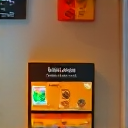

'Similarity: 0.5283, path=/home/karol/sd-imbalance/flux_tests/02848_cat_taken from above_walking.png'

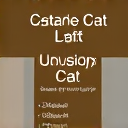

'Similarity: 0.5405, path=/home/karol/sd-imbalance/flux_tests/07218_cat_front-facing_walking.png'

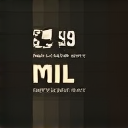

'Similarity: 0.5522, path=/home/karol/sd-imbalance/flux_tests/04700_cat_taken from below_jumping.png'

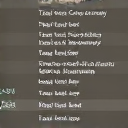

'Similarity: 0.5542, path=/home/karol/sd-imbalance/flux_tests/04655_cat_taken from below_sitting.png'

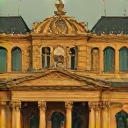

'Similarity: 0.5566, path=/home/karol/sd-imbalance/flux_tests/04789_cat_side-view_pouncing.png'

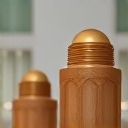

'Similarity: 0.5674, path=/home/karol/sd-imbalance/flux_tests/03060_cat_taken from above_looking to the left.png'

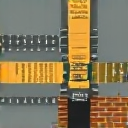

'Similarity: 0.5674, path=/home/karol/sd-imbalance/flux_tests/03354_cat_taken from below_pouncing.png'

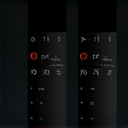

'Similarity: 0.5703, path=/home/karol/sd-imbalance/flux_tests/03284_cat_side-view_walking.png'

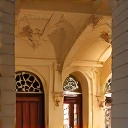

'Similarity: 0.5747, path=/home/karol/sd-imbalance/flux_tests/02397_cat_taken from below_playing.png'

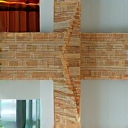

'Similarity: 0.5776, path=/home/karol/sd-imbalance/flux_tests/08971_cat_side-view_looking down.png'

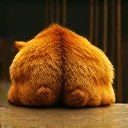

'Similarity: 0.5850, path=/home/karol/sd-imbalance/flux_tests/06285_cat_taken from behind_sleeping.png'

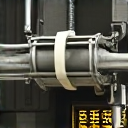

'Similarity: 0.5850, path=/home/karol/sd-imbalance/flux_tests/09308_cat_taken from below_looking up and to the right.png'

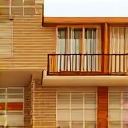

'Similarity: 0.5884, path=/home/karol/sd-imbalance/flux_tests/08081_cat_front-facing_eyes closed.png'

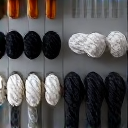

'Similarity: 0.5918, path=/home/karol/sd-imbalance/flux_tests/03737_cat_taken from behind_eating.png'

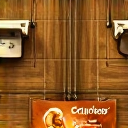

'Similarity: 0.5928, path=/home/karol/sd-imbalance/flux_tests/04513_cat_front-facing_sleeping.png'

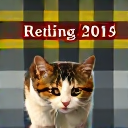

'Similarity: 0.5942, path=/home/karol/sd-imbalance/flux_tests/02299_cat_taken from below_walking.png'

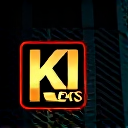

'Similarity: 0.5952, path=/home/karol/sd-imbalance/flux_tests/03575_cat_taken from behind_eyes closed.png'

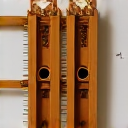

'Similarity: 0.5957, path=/home/karol/sd-imbalance/flux_tests/08796_cat_taken from below_walking.png'

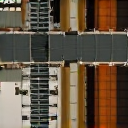

'Similarity: 0.5957, path=/home/karol/sd-imbalance/flux_tests/06205_cat_taken from above_looking straight ahead.png'

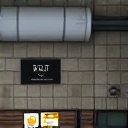

'Similarity: 0.5981, path=/home/karol/sd-imbalance/flux_tests/07333_cat_side-view_eating.png'

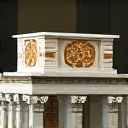

'Similarity: 0.6001, path=/home/karol/sd-imbalance/flux_tests/04112_cat_front-facing_looking to the right.png'

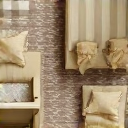

'Similarity: 0.6001, path=/home/karol/sd-imbalance/flux_tests/02560_cat_taken from above_sleeping.png'

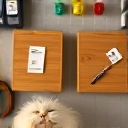

'Similarity: 0.6016, path=/home/karol/sd-imbalance/flux_tests/03309_cat_taken from above_grooming.png'

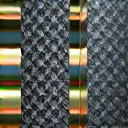

'Similarity: 0.6025, path=/home/karol/sd-imbalance/flux_tests/02888_cat_taken from below_eyes closed.png'

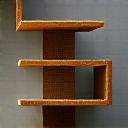

'Similarity: 0.6035, path=/home/karol/sd-imbalance/flux_tests/09433_cat_front-facing_crouching.png'

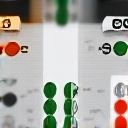

'Similarity: 0.6045, path=/home/karol/sd-imbalance/flux_tests/07794_cat_front-facing_eating.png'

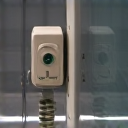

'Similarity: 0.6050, path=/home/karol/sd-imbalance/flux_tests/09671_cat_taken from behind_grooming.png'

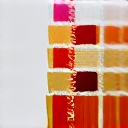

'Similarity: 0.6055, path=/home/karol/sd-imbalance/flux_tests/06380_cat_taken from below_sitting.png'

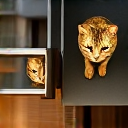

'Similarity: 0.6074, path=/home/karol/sd-imbalance/flux_tests/06831_cat_taken from above_looking down.png'

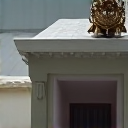

'Similarity: 0.6089, path=/home/karol/sd-imbalance/flux_tests/04886_cat_taken from above_crouching.png'

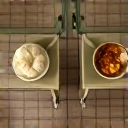

'Similarity: 0.6089, path=/home/karol/sd-imbalance/flux_tests/05302_cat_taken from above_eating.png'

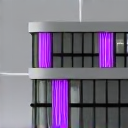

'Similarity: 0.6094, path=/home/karol/sd-imbalance/flux_tests/04193_cat_taken from below_looking to the right.png'

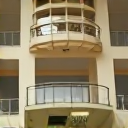

'Similarity: 0.6094, path=/home/karol/sd-imbalance/flux_tests/08899_cat_taken from below_sitting.png'

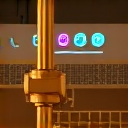

'Similarity: 0.6099, path=/home/karol/sd-imbalance/flux_tests/07359_cat_side-view_playing.png'

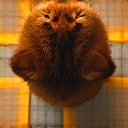

'Similarity: 0.6108, path=/home/karol/sd-imbalance/flux_tests/05034_cat_taken from above_grooming.png'

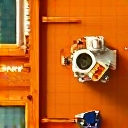

'Similarity: 0.6113, path=/home/karol/sd-imbalance/flux_tests/02161_cat_taken from above_looking to the left.png'

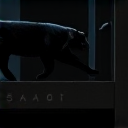

'Similarity: 0.6123, path=/home/karol/sd-imbalance/flux_tests/05107_cat_side-view_jumping.png'

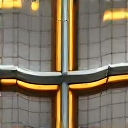

'Similarity: 0.6128, path=/home/karol/sd-imbalance/flux_tests/03948_cat_taken from above_eyes closed.png'

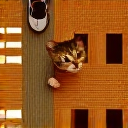

'Similarity: 0.6133, path=/home/karol/sd-imbalance/flux_tests/02006_cat_taken from above_looking down and to the right.png'

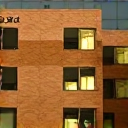

'Similarity: 0.6133, path=/home/karol/sd-imbalance/flux_tests/02772_cat_taken from below_grooming.png'

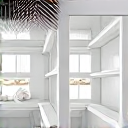

'Similarity: 0.6143, path=/home/karol/sd-imbalance/flux_tests/03549_cat_taken from below_sleeping.png'

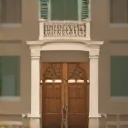

'Similarity: 0.6152, path=/home/karol/sd-imbalance/flux_tests/03073_cat_taken from behind_sitting.png'

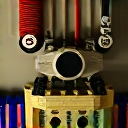

'Similarity: 0.6157, path=/home/karol/sd-imbalance/flux_tests/02952_cat_taken from above_pouncing.png'

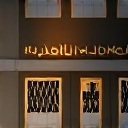

'Similarity: 0.6157, path=/home/karol/sd-imbalance/flux_tests/04410_cat_side-view_stretching.png'

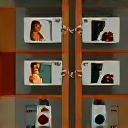

'Similarity: 0.6167, path=/home/karol/sd-imbalance/flux_tests/06308_cat_taken from below_stretching.png'

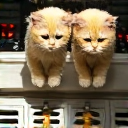

'Similarity: 0.6177, path=/home/karol/sd-imbalance/flux_tests/00640_cat_front-facing_looking down.png'

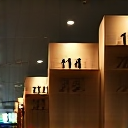

'Similarity: 0.6187, path=/home/karol/sd-imbalance/flux_tests/01600_cat_side-view_looking up.png'

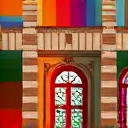

'Similarity: 0.6187, path=/home/karol/sd-imbalance/flux_tests/08740_cat_taken from above_looking up and to the right.png'

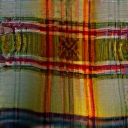

'Similarity: 0.6196, path=/home/karol/sd-imbalance/flux_tests/07395_cat_taken from above_walking.png'

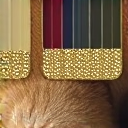

'Similarity: 0.6201, path=/home/karol/sd-imbalance/flux_tests/07974_cat_taken from above_eyes closed.png'

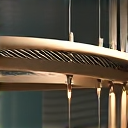

'Similarity: 0.6211, path=/home/karol/sd-imbalance/flux_tests/09799_cat_side-view_looking up.png'

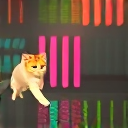

'Similarity: 0.6211, path=/home/karol/sd-imbalance/flux_tests/02554_cat_taken from above_walking.png'

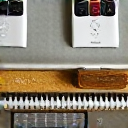

'Similarity: 0.6216, path=/home/karol/sd-imbalance/flux_tests/03532_cat_taken from above_sleeping.png'

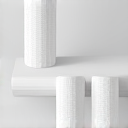

'Similarity: 0.6216, path=/home/karol/sd-imbalance/flux_tests/05299_cat_side-view_standing.png'

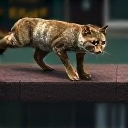

'Similarity: 0.6221, path=/home/karol/sd-imbalance/flux_tests/09596_cat_side-view_pouncing.png'

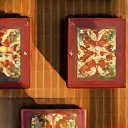

'Similarity: 0.6226, path=/home/karol/sd-imbalance/flux_tests/01639_cat_taken from above_pouncing.png'

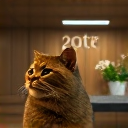

'Similarity: 0.6230, path=/home/karol/sd-imbalance/flux_tests/02795_cat_side-view_looking over its shoulder.png'

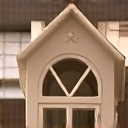

'Similarity: 0.6230, path=/home/karol/sd-imbalance/flux_tests/02941_cat_taken from below_looking down and to the left.png'

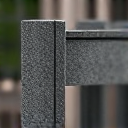

'Similarity: 0.6230, path=/home/karol/sd-imbalance/flux_tests/04362_cat_taken from below_pouncing.png'

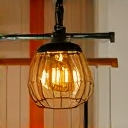

'Similarity: 0.6235, path=/home/karol/sd-imbalance/flux_tests/06495_cat_taken from above_pouncing.png'

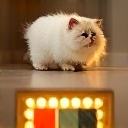

'Similarity: 0.6240, path=/home/karol/sd-imbalance/flux_tests/01826_cat_side-view_playing.png'

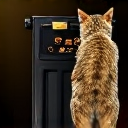

'Similarity: 0.6240, path=/home/karol/sd-imbalance/flux_tests/04766_cat_taken from behind_grooming.png'

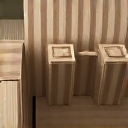

'Similarity: 0.6245, path=/home/karol/sd-imbalance/flux_tests/04043_cat_taken from below_playing.png'

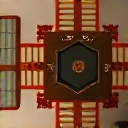

'Similarity: 0.6245, path=/home/karol/sd-imbalance/flux_tests/02919_cat_taken from above_pouncing.png'

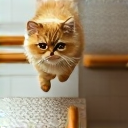

'Similarity: 0.6260, path=/home/karol/sd-imbalance/flux_tests/08606_cat_taken from above_playing.png'

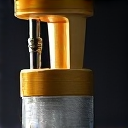

'Similarity: 0.6260, path=/home/karol/sd-imbalance/flux_tests/03691_cat_side-view_grooming.png'

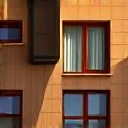

'Similarity: 0.6260, path=/home/karol/sd-imbalance/flux_tests/07164_cat_side-view_looking down.png'

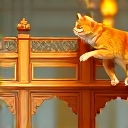

'Similarity: 0.6265, path=/home/karol/sd-imbalance/flux_tests/02315_cat_side-view_pouncing.png'

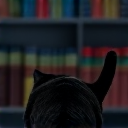

'Similarity: 0.6270, path=/home/karol/sd-imbalance/flux_tests/09129_cat_taken from behind_looking down.png'

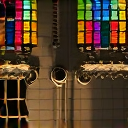

'Similarity: 0.6270, path=/home/karol/sd-imbalance/flux_tests/02920_cat_taken from below_looking down.png'

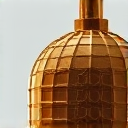

'Similarity: 0.6270, path=/home/karol/sd-imbalance/flux_tests/04709_cat_taken from below_looking to the right.png'

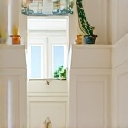

'Similarity: 0.6274, path=/home/karol/sd-imbalance/flux_tests/04411_cat_taken from below_looking down and to the right.png'

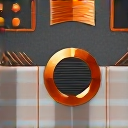

'Similarity: 0.6274, path=/home/karol/sd-imbalance/flux_tests/03360_cat_side-view_grooming.png'

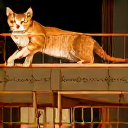

'Similarity: 0.6279, path=/home/karol/sd-imbalance/flux_tests/04407_cat_taken from below_sleeping.png'

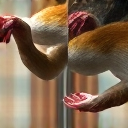

'Similarity: 0.6279, path=/home/karol/sd-imbalance/flux_tests/03112_cat_taken from below_grooming.png'

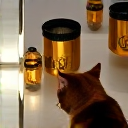

'Similarity: 0.6284, path=/home/karol/sd-imbalance/flux_tests/03012_cat_taken from above_eating.png'

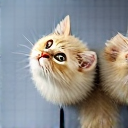

'Similarity: 0.6284, path=/home/karol/sd-imbalance/flux_tests/01386_cat_taken from above_looking up and to the right.png'

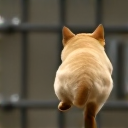

'Similarity: 0.6289, path=/home/karol/sd-imbalance/flux_tests/07529_cat_taken from behind_jumping.png'

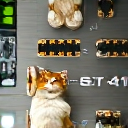

'Similarity: 0.6289, path=/home/karol/sd-imbalance/flux_tests/04135_cat_taken from above_looking to the left.png'

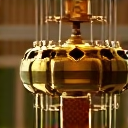

'Similarity: 0.6294, path=/home/karol/sd-imbalance/flux_tests/05013_cat_taken from below_looking to the right.png'

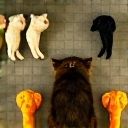

'Similarity: 0.6294, path=/home/karol/sd-imbalance/flux_tests/01749_cat_taken from above_grooming.png'

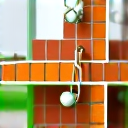

'Similarity: 0.6299, path=/home/karol/sd-imbalance/flux_tests/06825_cat_taken from below_walking.png'

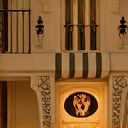

'Similarity: 0.6299, path=/home/karol/sd-imbalance/flux_tests/05073_cat_taken from below_looking down and to the right.png'

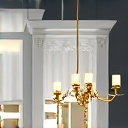

'Similarity: 0.6299, path=/home/karol/sd-imbalance/flux_tests/07563_cat_taken from below_sleeping.png'

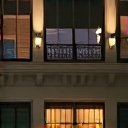

'Similarity: 0.6304, path=/home/karol/sd-imbalance/flux_tests/09109_cat_taken from below_looking straight ahead.png'

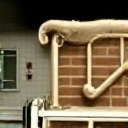

'Similarity: 0.6304, path=/home/karol/sd-imbalance/flux_tests/05866_cat_taken from behind_sleeping.png'

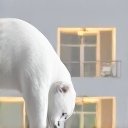

'Similarity: 0.6309, path=/home/karol/sd-imbalance/flux_tests/01486_cat_side-view_looking down and to the left.png'

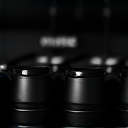

'Similarity: 0.6318, path=/home/karol/sd-imbalance/flux_tests/07113_cat_side-view_pouncing.png'

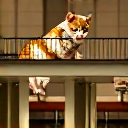

'Similarity: 0.6318, path=/home/karol/sd-imbalance/flux_tests/04566_cat_taken from below_grooming.png'

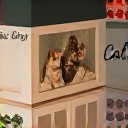

'Similarity: 0.6323, path=/home/karol/sd-imbalance/flux_tests/09660_cat_front-facing_sleeping.png'

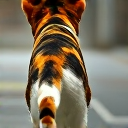

'Similarity: 0.6323, path=/home/karol/sd-imbalance/flux_tests/07830_cat_taken from behind_walking.png'

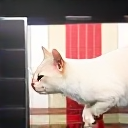

'Similarity: 0.6323, path=/home/karol/sd-imbalance/flux_tests/03508_cat_side-view_eating.png'

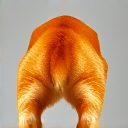

'Similarity: 0.6323, path=/home/karol/sd-imbalance/flux_tests/07465_cat_taken from behind_crouching.png'

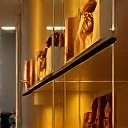

'Similarity: 0.6338, path=/home/karol/sd-imbalance/flux_tests/07289_cat_taken from below_looking to the left.png'

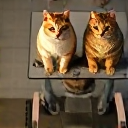

'Similarity: 0.6343, path=/home/karol/sd-imbalance/flux_tests/00009_cat_taken from above_sitting.png'

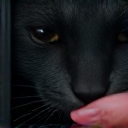

'Similarity: 0.6343, path=/home/karol/sd-imbalance/flux_tests/06991_cat_taken from below_eating.png'

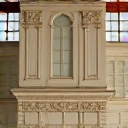

'Similarity: 0.6348, path=/home/karol/sd-imbalance/flux_tests/06259_cat_taken from above_eyes closed.png'

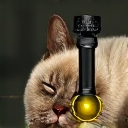

'Similarity: 0.6353, path=/home/karol/sd-imbalance/flux_tests/03595_cat_taken from below_sleeping.png'

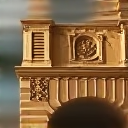

'Similarity: 0.6353, path=/home/karol/sd-imbalance/flux_tests/07155_cat_taken from below_looking up.png'

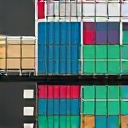

'Similarity: 0.6353, path=/home/karol/sd-imbalance/flux_tests/06708_cat_taken from above_looking down.png'

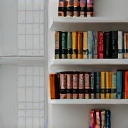

'Similarity: 0.6353, path=/home/karol/sd-imbalance/flux_tests/05671_cat_side-view_looking down and to the right.png'

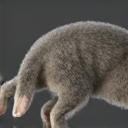

'Similarity: 0.6362, path=/home/karol/sd-imbalance/flux_tests/05215_cat_side-view_stretching.png'

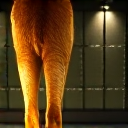

'Similarity: 0.6362, path=/home/karol/sd-imbalance/flux_tests/04836_cat_taken from behind_looking down.png'

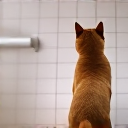

'Similarity: 0.6367, path=/home/karol/sd-imbalance/flux_tests/01092_cat_taken from behind_looking up and to the right.png'

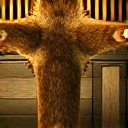

'Similarity: 0.6367, path=/home/karol/sd-imbalance/flux_tests/09334_cat_taken from above_eating.png'

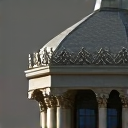

'Similarity: 0.6367, path=/home/karol/sd-imbalance/flux_tests/02586_cat_taken from below_looking up and to the left.png'

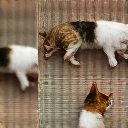

'Similarity: 0.6367, path=/home/karol/sd-imbalance/flux_tests/06704_cat_taken from above_sleeping.png'

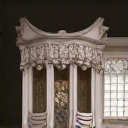

'Similarity: 0.6372, path=/home/karol/sd-imbalance/flux_tests/08620_cat_side-view_looking to the right.png'

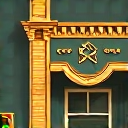

'Similarity: 0.6377, path=/home/karol/sd-imbalance/flux_tests/04099_cat_front-facing_looking up and to the right.png'

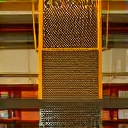

'Similarity: 0.6382, path=/home/karol/sd-imbalance/flux_tests/06268_cat_taken from below_eating.png'

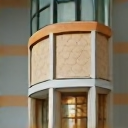

'Similarity: 0.6387, path=/home/karol/sd-imbalance/flux_tests/08289_cat_taken from below_sitting.png'

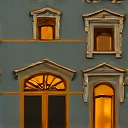

'Similarity: 0.6387, path=/home/karol/sd-imbalance/flux_tests/07375_cat_taken from below_pouncing.png'

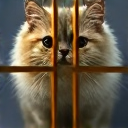

'Similarity: 0.6392, path=/home/karol/sd-imbalance/flux_tests/02921_cat_taken from below_crouching.png'

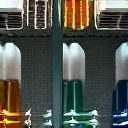

'Similarity: 0.6392, path=/home/karol/sd-imbalance/flux_tests/05225_cat_taken from below_eating.png'

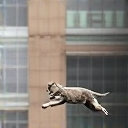

'Similarity: 0.6396, path=/home/karol/sd-imbalance/flux_tests/06777_cat_taken from above_running.png'

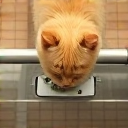

'Similarity: 0.6401, path=/home/karol/sd-imbalance/flux_tests/09239_cat_taken from above_eating.png'

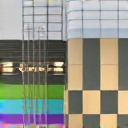

'Similarity: 0.6401, path=/home/karol/sd-imbalance/flux_tests/01548_cat_side-view_eyes closed.png'

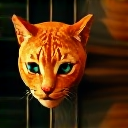

'Similarity: 0.6406, path=/home/karol/sd-imbalance/flux_tests/03458_cat_side-view_pouncing.png'

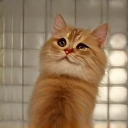

'Similarity: 0.6406, path=/home/karol/sd-imbalance/flux_tests/02693_cat_taken from above_looking over its shoulder.png'

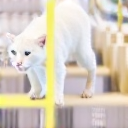

'Similarity: 0.6416, path=/home/karol/sd-imbalance/flux_tests/04365_cat_taken from below_pouncing.png'

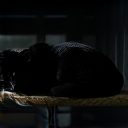

'Similarity: 0.6416, path=/home/karol/sd-imbalance/flux_tests/08634_cat_taken from behind_sleeping.png'

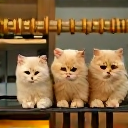

'Similarity: 0.6416, path=/home/karol/sd-imbalance/flux_tests/07951_cat_front-facing_eating.png'

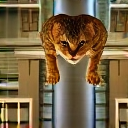

'Similarity: 0.6416, path=/home/karol/sd-imbalance/flux_tests/05606_cat_taken from below_pouncing.png'

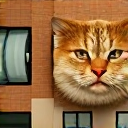

'Similarity: 0.6416, path=/home/karol/sd-imbalance/flux_tests/06159_cat_side-view_eating.png'

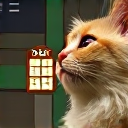

'Similarity: 0.6421, path=/home/karol/sd-imbalance/flux_tests/04011_cat_side-view_looking up.png'

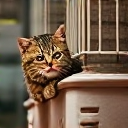

'Similarity: 0.6421, path=/home/karol/sd-imbalance/flux_tests/03804_cat_taken from below_eating.png'

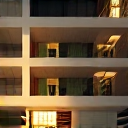

'Similarity: 0.6426, path=/home/karol/sd-imbalance/flux_tests/04150_cat_taken from below_looking down.png'

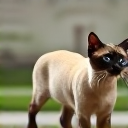

'Similarity: 0.6436, path=/home/karol/sd-imbalance/flux_tests/01736_cat_side-view_walking.png'

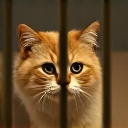

'Similarity: 0.6440, path=/home/karol/sd-imbalance/flux_tests/05876_cat_taken from below_pouncing.png'

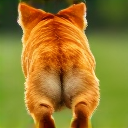

'Similarity: 0.6440, path=/home/karol/sd-imbalance/flux_tests/09745_cat_taken from behind_running.png'

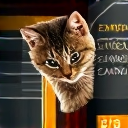

'Similarity: 0.6450, path=/home/karol/sd-imbalance/flux_tests/07790_cat_side-view_looking down and to the left.png'

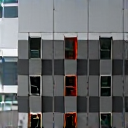

'Similarity: 0.6455, path=/home/karol/sd-imbalance/flux_tests/05166_cat_taken from above_looking to the right.png'

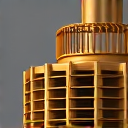

'Similarity: 0.6455, path=/home/karol/sd-imbalance/flux_tests/06417_cat_taken from below_looking down and to the left.png'

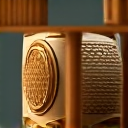

'Similarity: 0.6455, path=/home/karol/sd-imbalance/flux_tests/07903_cat_taken from below_looking up and to the left.png'

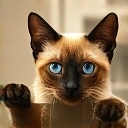

'Similarity: 0.6460, path=/home/karol/sd-imbalance/flux_tests/08610_cat_taken from below_playing.png'

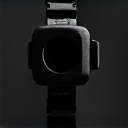

'Similarity: 0.6460, path=/home/karol/sd-imbalance/flux_tests/09099_cat_side-view_pouncing.png'

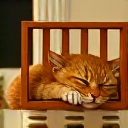

'Similarity: 0.6465, path=/home/karol/sd-imbalance/flux_tests/02103_cat_taken from below_sleeping.png'

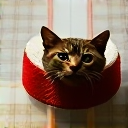

'Similarity: 0.6470, path=/home/karol/sd-imbalance/flux_tests/03181_cat_taken from above_looking over its shoulder.png'

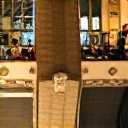

'Similarity: 0.6470, path=/home/karol/sd-imbalance/flux_tests/07622_cat_taken from above_looking straight ahead.png'

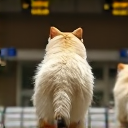

'Similarity: 0.6475, path=/home/karol/sd-imbalance/flux_tests/07237_cat_taken from behind_looking up and to the right.png'

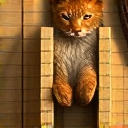

'Similarity: 0.6475, path=/home/karol/sd-imbalance/flux_tests/04799_cat_taken from above_looking to the right.png'

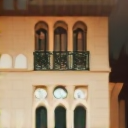

'Similarity: 0.6479, path=/home/karol/sd-imbalance/flux_tests/02111_cat_side-view_playing.png'

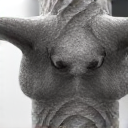

'Similarity: 0.6484, path=/home/karol/sd-imbalance/flux_tests/04658_cat_taken from above_looking down and to the right.png'

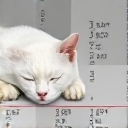

'Similarity: 0.6484, path=/home/karol/sd-imbalance/flux_tests/03821_cat_side-view_sleeping.png'

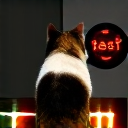

'Similarity: 0.6484, path=/home/karol/sd-imbalance/flux_tests/03187_cat_taken from behind_looking down and to the left.png'

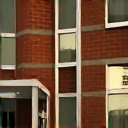

'Similarity: 0.6484, path=/home/karol/sd-imbalance/flux_tests/05804_cat_taken from below_pouncing.png'

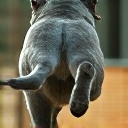

'Similarity: 0.6489, path=/home/karol/sd-imbalance/flux_tests/04097_cat_taken from below_running.png'

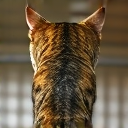

'Similarity: 0.6489, path=/home/karol/sd-imbalance/flux_tests/06196_cat_taken from behind_walking.png'

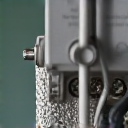

'Similarity: 0.6489, path=/home/karol/sd-imbalance/flux_tests/07541_cat_side-view_looking to the left.png'

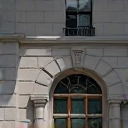

'Similarity: 0.6494, path=/home/karol/sd-imbalance/flux_tests/02770_cat_taken from below_stretching.png'

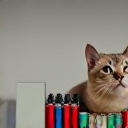

'Similarity: 0.6494, path=/home/karol/sd-imbalance/flux_tests/01621_cat_taken from below_looking up and to the left.png'

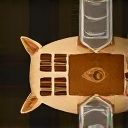

'Similarity: 0.6499, path=/home/karol/sd-imbalance/flux_tests/09181_cat_taken from below_looking to the right.png'

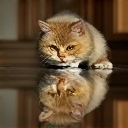

'Similarity: 0.6499, path=/home/karol/sd-imbalance/flux_tests/08035_cat_taken from below_walking.png'

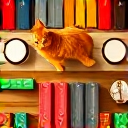

'Similarity: 0.6504, path=/home/karol/sd-imbalance/flux_tests/05437_cat_taken from above_playing.png'

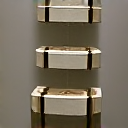

'Similarity: 0.6504, path=/home/karol/sd-imbalance/flux_tests/03675_cat_taken from below_sitting.png'

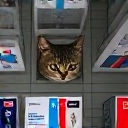

'Similarity: 0.6504, path=/home/karol/sd-imbalance/flux_tests/03773_cat_taken from below_eating.png'

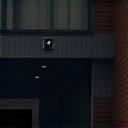

'Similarity: 0.6504, path=/home/karol/sd-imbalance/flux_tests/09965_cat_taken from below_looking up.png'

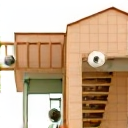

'Similarity: 0.6504, path=/home/karol/sd-imbalance/flux_tests/07399_cat_side-view_crouching.png'

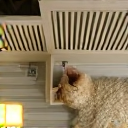

'Similarity: 0.6509, path=/home/karol/sd-imbalance/flux_tests/08770_cat_taken from below_sleeping.png'

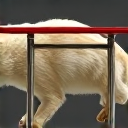

'Similarity: 0.6509, path=/home/karol/sd-imbalance/flux_tests/03735_cat_side-view_crouching.png'

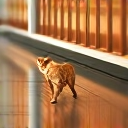

'Similarity: 0.6514, path=/home/karol/sd-imbalance/flux_tests/06974_cat_taken from above_running.png'

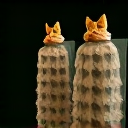

'Similarity: 0.6514, path=/home/karol/sd-imbalance/flux_tests/01933_cat_taken from behind_looking up and to the right.png'

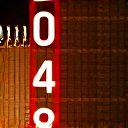

'Similarity: 0.6514, path=/home/karol/sd-imbalance/flux_tests/05021_cat_taken from above_eyes closed.png'

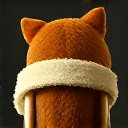

'Similarity: 0.6519, path=/home/karol/sd-imbalance/flux_tests/01986_cat_taken from behind_grooming.png'

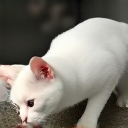

'Similarity: 0.6519, path=/home/karol/sd-imbalance/flux_tests/02271_cat_taken from below_crouching.png'

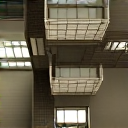

'Similarity: 0.6519, path=/home/karol/sd-imbalance/flux_tests/06362_cat_taken from above_looking down and to the left.png'

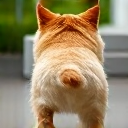

'Similarity: 0.6523, path=/home/karol/sd-imbalance/flux_tests/02558_cat_taken from behind_walking.png'

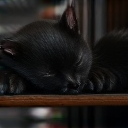

'Similarity: 0.6523, path=/home/karol/sd-imbalance/flux_tests/01883_cat_taken from below_sleeping.png'

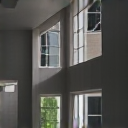

'Similarity: 0.6523, path=/home/karol/sd-imbalance/flux_tests/02238_cat_taken from below_sitting.png'

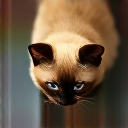

'Similarity: 0.6523, path=/home/karol/sd-imbalance/flux_tests/03979_cat_taken from above_crouching.png'

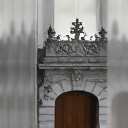

'Similarity: 0.6523, path=/home/karol/sd-imbalance/flux_tests/09605_cat_taken from above_running.png'

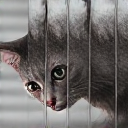

'Similarity: 0.6523, path=/home/karol/sd-imbalance/flux_tests/04550_cat_taken from below_looking down.png'

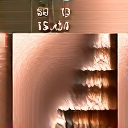

'Similarity: 0.6523, path=/home/karol/sd-imbalance/flux_tests/01895_cat_taken from below_grooming.png'

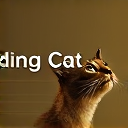

'Similarity: 0.6523, path=/home/karol/sd-imbalance/flux_tests/02384_cat_side-view_looking up.png'

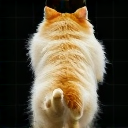

'Similarity: 0.6523, path=/home/karol/sd-imbalance/flux_tests/08041_cat_taken from behind_jumping.png'

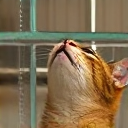

'Similarity: 0.6528, path=/home/karol/sd-imbalance/flux_tests/04620_cat_taken from below_looking up and to the left.png'

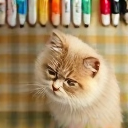

'Similarity: 0.6528, path=/home/karol/sd-imbalance/flux_tests/07741_cat_taken from above_grooming.png'

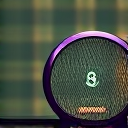

'Similarity: 0.6528, path=/home/karol/sd-imbalance/flux_tests/08418_cat_taken from behind_looking down and to the right.png'

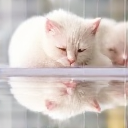

'Similarity: 0.6533, path=/home/karol/sd-imbalance/flux_tests/01622_cat_side-view_looking down.png'

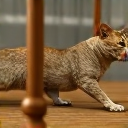

'Similarity: 0.6533, path=/home/karol/sd-imbalance/flux_tests/00023_cat_side-view_stretching.png'

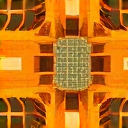

'Similarity: 0.6533, path=/home/karol/sd-imbalance/flux_tests/08952_cat_taken from above_eyes closed.png'

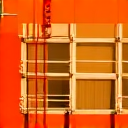

'Similarity: 0.6533, path=/home/karol/sd-imbalance/flux_tests/07005_cat_side-view_jumping.png'

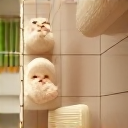

'Similarity: 0.6538, path=/home/karol/sd-imbalance/flux_tests/05164_cat_taken from below_grooming.png'

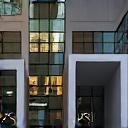

'Similarity: 0.6538, path=/home/karol/sd-imbalance/flux_tests/08331_cat_taken from below_looking up.png'

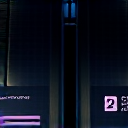

'Similarity: 0.6538, path=/home/karol/sd-imbalance/flux_tests/04449_cat_taken from above_eyes closed.png'

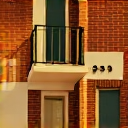

'Similarity: 0.6538, path=/home/karol/sd-imbalance/flux_tests/06537_cat_taken from below_eating.png'

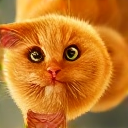

'Similarity: 0.6543, path=/home/karol/sd-imbalance/flux_tests/03155_cat_taken from above_grooming.png'

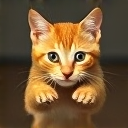

'Similarity: 0.6543, path=/home/karol/sd-imbalance/flux_tests/09993_cat_front-facing_jumping.png'

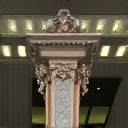

'Similarity: 0.6543, path=/home/karol/sd-imbalance/flux_tests/06752_cat_side-view_pouncing.png'

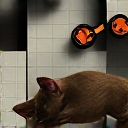

'Similarity: 0.6543, path=/home/karol/sd-imbalance/flux_tests/08234_cat_taken from below_sleeping.png'

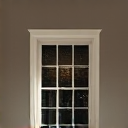

'Similarity: 0.6543, path=/home/karol/sd-imbalance/flux_tests/03174_cat_taken from behind_looking up and to the left.png'

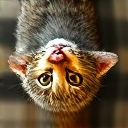

'Similarity: 0.6548, path=/home/karol/sd-imbalance/flux_tests/01919_cat_taken from above_stretching.png'

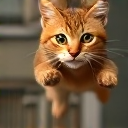

'Similarity: 0.6553, path=/home/karol/sd-imbalance/flux_tests/05281_cat_taken from below_jumping.png'

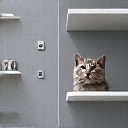

'Similarity: 0.6553, path=/home/karol/sd-imbalance/flux_tests/04271_cat_taken from above_looking up and to the left.png'

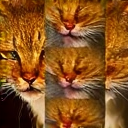

'Similarity: 0.6558, path=/home/karol/sd-imbalance/flux_tests/07328_cat_side-view_looking down and to the left.png'

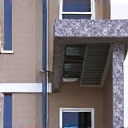

'Similarity: 0.6558, path=/home/karol/sd-imbalance/flux_tests/07412_cat_taken from above_looking to the left.png'

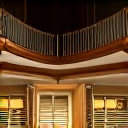

'Similarity: 0.6558, path=/home/karol/sd-imbalance/flux_tests/03162_cat_front-facing_sleeping.png'

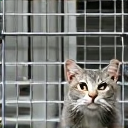

'Similarity: 0.6558, path=/home/karol/sd-imbalance/flux_tests/08508_cat_front-facing_eating.png'

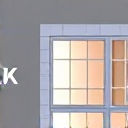

'Similarity: 0.6558, path=/home/karol/sd-imbalance/flux_tests/06349_cat_side-view_looking straight ahead.png'

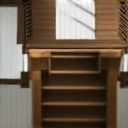

'Similarity: 0.6562, path=/home/karol/sd-imbalance/flux_tests/04330_cat_taken from above_looking down and to the left.png'

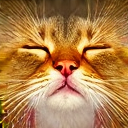

'Similarity: 0.6562, path=/home/karol/sd-imbalance/flux_tests/01551_cat_taken from below_eyes closed.png'

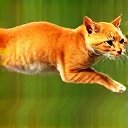

'Similarity: 0.6562, path=/home/karol/sd-imbalance/flux_tests/05746_cat_side-view_running.png'

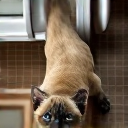

'Similarity: 0.6562, path=/home/karol/sd-imbalance/flux_tests/05265_cat_taken from above_looking down.png'

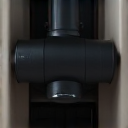

'Similarity: 0.6562, path=/home/karol/sd-imbalance/flux_tests/04562_cat_taken from above_looking to the right.png'

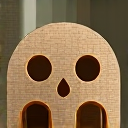

'Similarity: 0.6562, path=/home/karol/sd-imbalance/flux_tests/05326_cat_side-view_looking over its shoulder.png'

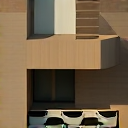

'Similarity: 0.6567, path=/home/karol/sd-imbalance/flux_tests/03296_cat_side-view_looking to the left.png'

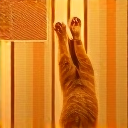

'Similarity: 0.6567, path=/home/karol/sd-imbalance/flux_tests/05771_cat_taken from below_playing.png'

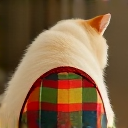

'Similarity: 0.6567, path=/home/karol/sd-imbalance/flux_tests/02454_cat_taken from behind_looking down and to the left.png'

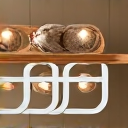

'Similarity: 0.6567, path=/home/karol/sd-imbalance/flux_tests/08428_cat_taken from above_sitting.png'

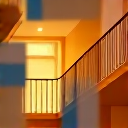

'Similarity: 0.6567, path=/home/karol/sd-imbalance/flux_tests/04637_cat_front-facing_playing.png'

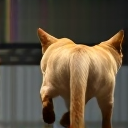

'Similarity: 0.6567, path=/home/karol/sd-imbalance/flux_tests/09875_cat_side-view_walking.png'

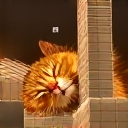

'Similarity: 0.6567, path=/home/karol/sd-imbalance/flux_tests/06549_cat_taken from below_sleeping.png'

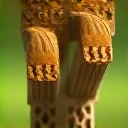

'Similarity: 0.6572, path=/home/karol/sd-imbalance/flux_tests/04080_cat_taken from below_running.png'

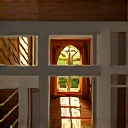

'Similarity: 0.6572, path=/home/karol/sd-imbalance/flux_tests/07497_cat_taken from above_looking up.png'

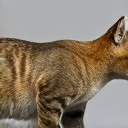

'Similarity: 0.6572, path=/home/karol/sd-imbalance/flux_tests/00000_cat_side-view_crouching.png'

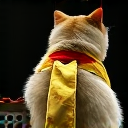

'Similarity: 0.6572, path=/home/karol/sd-imbalance/flux_tests/06515_cat_taken from behind_sitting.png'

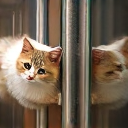

'Similarity: 0.6577, path=/home/karol/sd-imbalance/flux_tests/01360_cat_taken from above_looking over its shoulder.png'

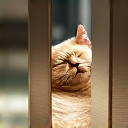

'Similarity: 0.6577, path=/home/karol/sd-imbalance/flux_tests/07822_cat_taken from behind_sleeping.png'

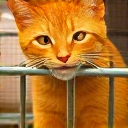

'Similarity: 0.6582, path=/home/karol/sd-imbalance/flux_tests/03426_cat_front-facing_eating.png'

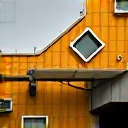

'Similarity: 0.6582, path=/home/karol/sd-imbalance/flux_tests/06130_cat_side-view_crouching.png'

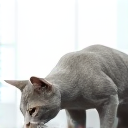

'Similarity: 0.6582, path=/home/karol/sd-imbalance/flux_tests/07126_cat_side-view_crouching.png'

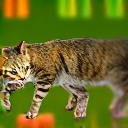

'Similarity: 0.6582, path=/home/karol/sd-imbalance/flux_tests/04648_cat_side-view_walking.png'

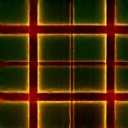

'Similarity: 0.6582, path=/home/karol/sd-imbalance/flux_tests/08359_cat_taken from behind_looking to the left.png'

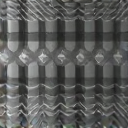

'Similarity: 0.6587, path=/home/karol/sd-imbalance/flux_tests/08297_cat_taken from above_crouching.png'

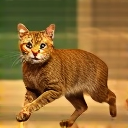

'Similarity: 0.6587, path=/home/karol/sd-imbalance/flux_tests/05748_cat_side-view_running.png'

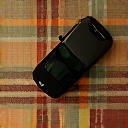

'Similarity: 0.6587, path=/home/karol/sd-imbalance/flux_tests/03231_cat_taken from above_grooming.png'

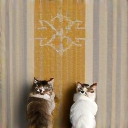

'Similarity: 0.6587, path=/home/karol/sd-imbalance/flux_tests/09819_cat_taken from above_running.png'

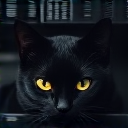

'Similarity: 0.6592, path=/home/karol/sd-imbalance/flux_tests/03869_cat_front-facing_eating.png'

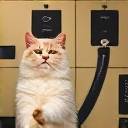

'Similarity: 0.6592, path=/home/karol/sd-imbalance/flux_tests/02450_cat_taken from above_stretching.png'

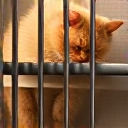

'Similarity: 0.6592, path=/home/karol/sd-imbalance/flux_tests/07561_cat_taken from below_eating.png'

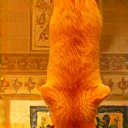

'Similarity: 0.6592, path=/home/karol/sd-imbalance/flux_tests/07520_cat_taken from above_eating.png'

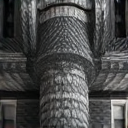

'Similarity: 0.6592, path=/home/karol/sd-imbalance/flux_tests/02231_cat_taken from below_eyes closed.png'

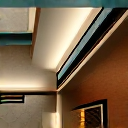

'Similarity: 0.6597, path=/home/karol/sd-imbalance/flux_tests/06243_cat_taken from above_sleeping.png'

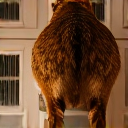

'Similarity: 0.6597, path=/home/karol/sd-imbalance/flux_tests/03822_cat_taken from behind_eating.png'

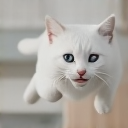

'Similarity: 0.6597, path=/home/karol/sd-imbalance/flux_tests/03810_cat_taken from above_jumping.png'

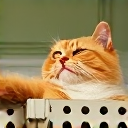

'Similarity: 0.6602, path=/home/karol/sd-imbalance/flux_tests/02631_cat_taken from below_stretching.png'

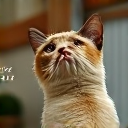

'Similarity: 0.6606, path=/home/karol/sd-imbalance/flux_tests/04481_cat_taken from behind_looking up.png'

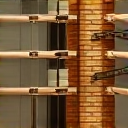

'Similarity: 0.6606, path=/home/karol/sd-imbalance/flux_tests/05743_cat_taken from below_playing.png'

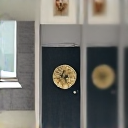

'Similarity: 0.6606, path=/home/karol/sd-imbalance/flux_tests/08110_cat_taken from above_standing.png'

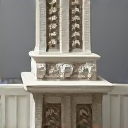

'Similarity: 0.6611, path=/home/karol/sd-imbalance/flux_tests/03733_cat_side-view_standing.png'

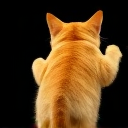

'Similarity: 0.6611, path=/home/karol/sd-imbalance/flux_tests/09391_cat_taken from behind_jumping.png'

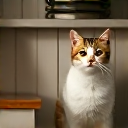

'Similarity: 0.6611, path=/home/karol/sd-imbalance/flux_tests/04969_cat_taken from below_standing.png'

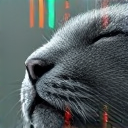

'Similarity: 0.6611, path=/home/karol/sd-imbalance/flux_tests/03936_cat_side-view_eyes closed.png'

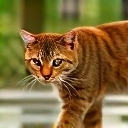

'Similarity: 0.6616, path=/home/karol/sd-imbalance/flux_tests/00610_cat_side-view_walking.png'

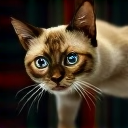

'Similarity: 0.6616, path=/home/karol/sd-imbalance/flux_tests/08670_cat_taken from below_pouncing.png'

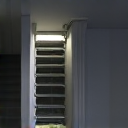

'Similarity: 0.6616, path=/home/karol/sd-imbalance/flux_tests/07761_cat_side-view_jumping.png'

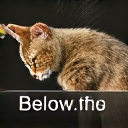

'Similarity: 0.6621, path=/home/karol/sd-imbalance/flux_tests/01839_cat_taken from below_grooming.png'

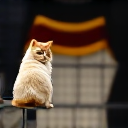

'Similarity: 0.6621, path=/home/karol/sd-imbalance/flux_tests/03312_cat_taken from behind_looking over its shoulder.png'

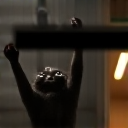

'Similarity: 0.6621, path=/home/karol/sd-imbalance/flux_tests/06568_cat_taken from below_playing.png'

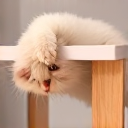

'Similarity: 0.6621, path=/home/karol/sd-imbalance/flux_tests/07696_cat_taken from below_grooming.png'

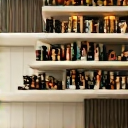

'Similarity: 0.6626, path=/home/karol/sd-imbalance/flux_tests/07233_cat_front-facing_looking down.png'

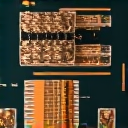

'Similarity: 0.6626, path=/home/karol/sd-imbalance/flux_tests/09754_cat_front-facing_looking down and to the right.png'

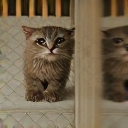

'Similarity: 0.6626, path=/home/karol/sd-imbalance/flux_tests/06446_cat_taken from above_looking down and to the right.png'

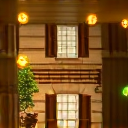

'Similarity: 0.6626, path=/home/karol/sd-imbalance/flux_tests/02096_cat_side-view_pouncing.png'

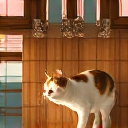

'Similarity: 0.6626, path=/home/karol/sd-imbalance/flux_tests/05295_cat_taken from below_eating.png'

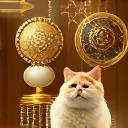

'Similarity: 0.6631, path=/home/karol/sd-imbalance/flux_tests/05428_cat_side-view_looking down and to the left.png'

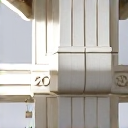

'Similarity: 0.6631, path=/home/karol/sd-imbalance/flux_tests/07690_cat_taken from below_eyes closed.png'

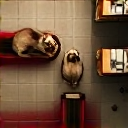

'Similarity: 0.6631, path=/home/karol/sd-imbalance/flux_tests/03094_cat_taken from above_eating.png'

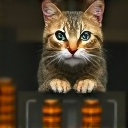

'Similarity: 0.6631, path=/home/karol/sd-imbalance/flux_tests/03257_cat_taken from below_sitting.png'

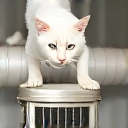

'Similarity: 0.6631, path=/home/karol/sd-imbalance/flux_tests/09041_cat_taken from below_pouncing.png'

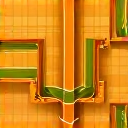

'Similarity: 0.6636, path=/home/karol/sd-imbalance/flux_tests/05060_cat_taken from above_looking straight ahead.png'

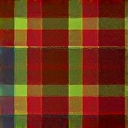

'Similarity: 0.6636, path=/home/karol/sd-imbalance/flux_tests/06065_cat_taken from above_looking to the left.png'

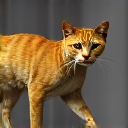

'Similarity: 0.6636, path=/home/karol/sd-imbalance/flux_tests/05797_cat_taken from below_walking.png'

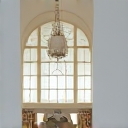

'Similarity: 0.6636, path=/home/karol/sd-imbalance/flux_tests/07217_cat_taken from below_sitting.png'

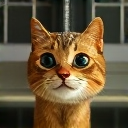

'Similarity: 0.6641, path=/home/karol/sd-imbalance/flux_tests/05521_cat_side-view_looking to the right.png'

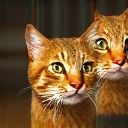

'Similarity: 0.6641, path=/home/karol/sd-imbalance/flux_tests/04922_cat_taken from above_looking up and to the right.png'

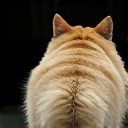

'Similarity: 0.6641, path=/home/karol/sd-imbalance/flux_tests/03953_cat_taken from behind_pouncing.png'

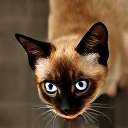

'Similarity: 0.6641, path=/home/karol/sd-imbalance/flux_tests/06900_cat_taken from above_pouncing.png'

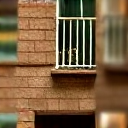

'Similarity: 0.6641, path=/home/karol/sd-imbalance/flux_tests/07110_cat_taken from below_playing.png'

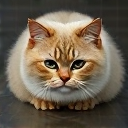

'Similarity: 0.6646, path=/home/karol/sd-imbalance/flux_tests/08963_cat_front-facing_crouching.png'

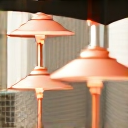

'Similarity: 0.6646, path=/home/karol/sd-imbalance/flux_tests/02020_cat_side-view_eating.png'

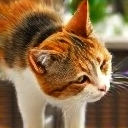

'Similarity: 0.6646, path=/home/karol/sd-imbalance/flux_tests/07946_cat_side-view_eating.png'

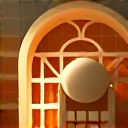

'Similarity: 0.6646, path=/home/karol/sd-imbalance/flux_tests/07475_cat_side-view_looking down and to the left.png'

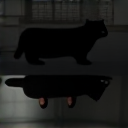

'Similarity: 0.6646, path=/home/karol/sd-imbalance/flux_tests/04977_cat_taken from above_looking down and to the left.png'

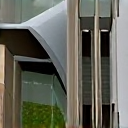

'Similarity: 0.6646, path=/home/karol/sd-imbalance/flux_tests/02457_cat_taken from below_looking down and to the left.png'

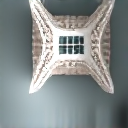

'Similarity: 0.6650, path=/home/karol/sd-imbalance/flux_tests/02391_cat_taken from above_sitting.png'

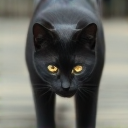

'Similarity: 0.6650, path=/home/karol/sd-imbalance/flux_tests/02228_cat_taken from below_walking.png'

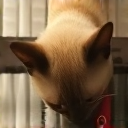

'Similarity: 0.6650, path=/home/karol/sd-imbalance/flux_tests/04605_cat_taken from above_eating.png'

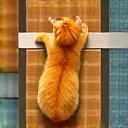

'Similarity: 0.6655, path=/home/karol/sd-imbalance/flux_tests/05234_cat_taken from above_playing.png'

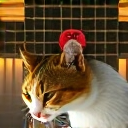

'Similarity: 0.6655, path=/home/karol/sd-imbalance/flux_tests/09146_cat_side-view_eating.png'

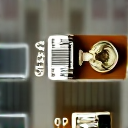

'Similarity: 0.6655, path=/home/karol/sd-imbalance/flux_tests/05362_cat_taken from below_looking up and to the right.png'

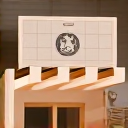

'Similarity: 0.6655, path=/home/karol/sd-imbalance/flux_tests/08749_cat_front-facing_playing.png'

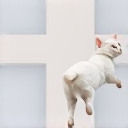

'Similarity: 0.6655, path=/home/karol/sd-imbalance/flux_tests/06075_cat_taken from behind_jumping.png'

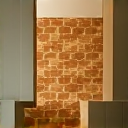

'Similarity: 0.6655, path=/home/karol/sd-imbalance/flux_tests/06907_cat_taken from below_sitting.png'

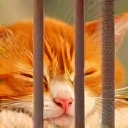

'Similarity: 0.6660, path=/home/karol/sd-imbalance/flux_tests/07041_cat_taken from below_sleeping.png'

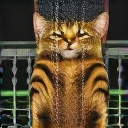

'Similarity: 0.6660, path=/home/karol/sd-imbalance/flux_tests/08018_cat_taken from below_sleeping.png'

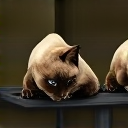

'Similarity: 0.6660, path=/home/karol/sd-imbalance/flux_tests/00483_cat_taken from below_looking down and to the left.png'

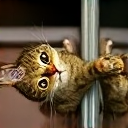

'Similarity: 0.6660, path=/home/karol/sd-imbalance/flux_tests/05587_cat_side-view_playing.png'

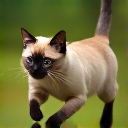

'Similarity: 0.6660, path=/home/karol/sd-imbalance/flux_tests/09750_cat_side-view_running.png'

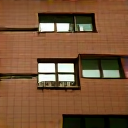

'Similarity: 0.6665, path=/home/karol/sd-imbalance/flux_tests/05138_cat_taken from below_looking up and to the right.png'

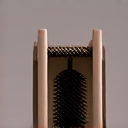

'Similarity: 0.6665, path=/home/karol/sd-imbalance/flux_tests/06997_cat_taken from behind_looking up and to the left.png'

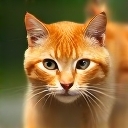

'Similarity: 0.6665, path=/home/karol/sd-imbalance/flux_tests/06979_cat_front-facing_running.png'

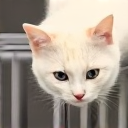

'Similarity: 0.6665, path=/home/karol/sd-imbalance/flux_tests/06637_cat_taken from below_grooming.png'

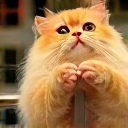

'Similarity: 0.6665, path=/home/karol/sd-imbalance/flux_tests/02742_cat_taken from below_grooming.png'

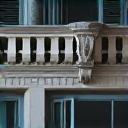

'Similarity: 0.6665, path=/home/karol/sd-imbalance/flux_tests/09259_cat_taken from above_looking up.png'

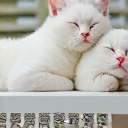

'Similarity: 0.6665, path=/home/karol/sd-imbalance/flux_tests/09106_cat_side-view_sleeping.png'

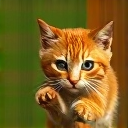

'Similarity: 0.6665, path=/home/karol/sd-imbalance/flux_tests/03137_cat_taken from above_jumping.png'

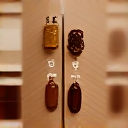

'Similarity: 0.6665, path=/home/karol/sd-imbalance/flux_tests/04485_cat_taken from above_sitting.png'

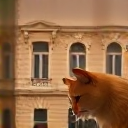

'Similarity: 0.6665, path=/home/karol/sd-imbalance/flux_tests/06765_cat_taken from below_looking down and to the right.png'

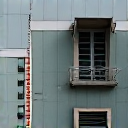

'Similarity: 0.6670, path=/home/karol/sd-imbalance/flux_tests/05773_cat_side-view_looking straight ahead.png'

In [8]:
# display the images with the highest and lowest similarity scores
def display_images(image_paths, similarity_scores, num_images=5, ascending=True):
    indices = np.argsort(similarity_scores)
    if not ascending:
        indices = indices[::-1]
    for i in range(num_images):
        idx = indices[i]
        score = similarity_scores[idx]
        path = image_paths[idx]
        img = Image.open(path)
        display(img, f"Similarity: {score:.4f}, path={path}")


# Display images with the highest similarity scores
display_images(valid_synthetic_files, similarity_scores, num_images=300, ascending=True)
# display_images(valid_synthetic_files, similarity_scores_ref_synth, num_images=3, ascending=True)

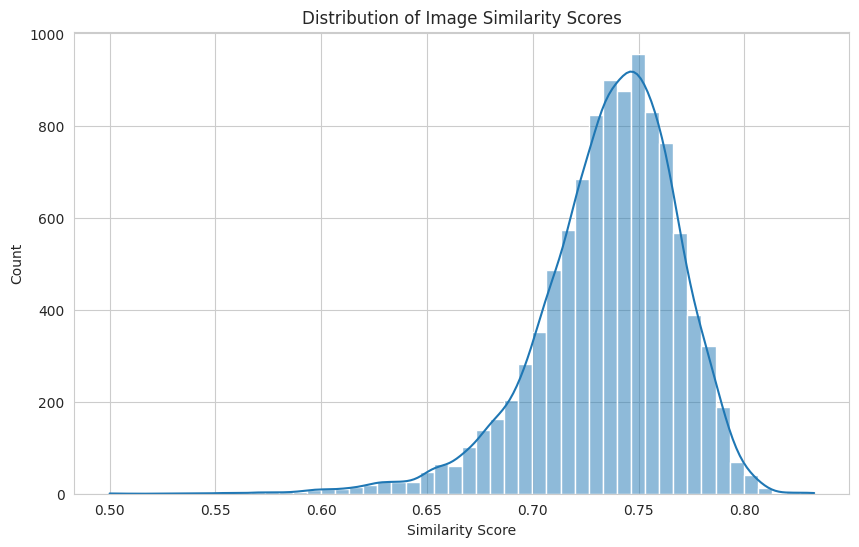

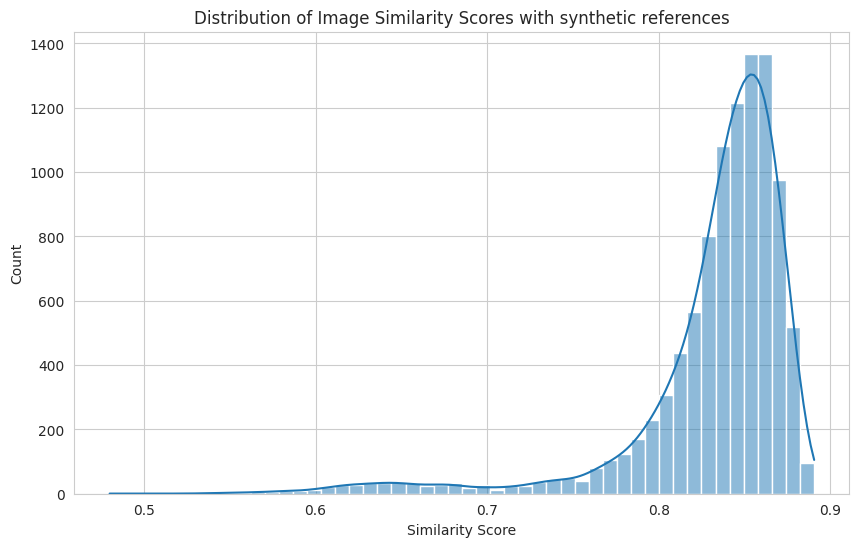

In [159]:
# plot the distribution of similarity scores
plt.figure(figsize=(10, 6))
sns.histplot(similarity_scores, bins=50, kde=True)
plt.title("Distribution of Image Similarity Scores")
plt.xlabel("Similarity Score")
plt.ylabel("Count")
plt.show()

# plot the distribution of similarity scores
plt.figure(figsize=(10, 6))
sns.histplot(similarity_scores_ref_synth, bins=50, kde=True)
plt.title("Distribution of Image Similarity Scores with synthetic references")
plt.xlabel("Similarity Score")
plt.ylabel("Count")
plt.show()

Explained variance ratio by PCA components: [0.11771824 0.07843095]


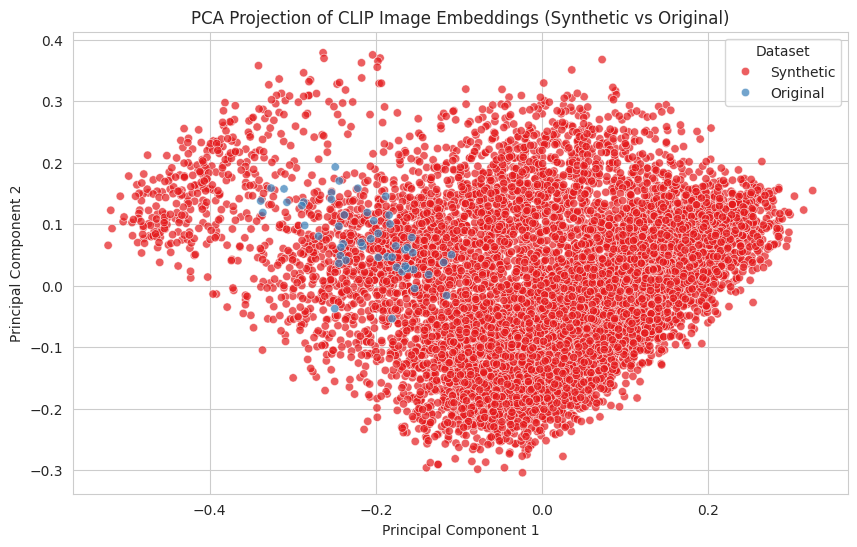

In [160]:
# Combine synthetic and original CLIP embeddings
all_embeddings = np.concatenate([clip_embeddings, clip_for_50_original_images], axis=0)
labels = ["Synthetic"] * len(clip_embeddings) + ["Original"] * len(
    clip_for_50_original_images
)

# Perform PCA
pca = PCA(n_components=2)
all_clip_pca = pca.fit_transform(all_embeddings)
print("Explained variance ratio by PCA components:", pca.explained_variance_ratio_)

# Create a DataFrame for visualization
df_all_clip_pca = pd.DataFrame(
    {"PC1": all_clip_pca[:, 0], "PC2": all_clip_pca[:, 1], "Dataset": labels}
)

# Plot the PCA projection
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df_all_clip_pca, x="PC1", y="PC2", hue="Dataset", alpha=0.7, palette="Set1"
)
plt.title("PCA Projection of CLIP Image Embeddings (Synthetic vs Original)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Dataset")
plt.show()